In [1]:
%load_ext dotenv
%dotenv

import tqdm
import flax
from flax import linen as nn
import jax
from typing import Dict, Callable, Sequence, Any, Union
from dataclasses import field
import jax.numpy as jnp
import tensorflow_datasets as tfds
import tensorflow as tf
import matplotlib.pyplot as plt
import einops
import clu
from clu import parameter_overview, metrics
from flax.training import train_state  # Useful dataclass to keep train state
import optax
from flax import struct                # Flax dataclasses
import time
import os
from datetime import datetime
import orbax
from flax.training import orbax_utils
import numpy as np
from einops import rearrange


2024-06-14 10:41:28.084191: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


# Initialization

In [2]:
# Some Optimizations
import ctypes

_libcudart = ctypes.CDLL("libcudart.so")
# Set device limit on the current device
# cudaLimitMaxL2FetchGranularity = 0x05
pValue = ctypes.cast((ctypes.c_int * 1)(), ctypes.POINTER(ctypes.c_int))
_libcudart.cudaDeviceSetLimit(ctypes.c_int(0x05), ctypes.c_int(128))
_libcudart.cudaDeviceGetLimit(pValue, ctypes.c_int(0x05))
assert pValue.contents.value == 128
tf.compat.v1.ConfigProto.force_gpu_compatible = True

gpus = tf.config.list_physical_devices("GPU")
if gpus:
    try:
        # Currently, memory growth needs to be the same across GPUs
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.list_logical_devices("GPU")
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Memory growth must be set before GPUs have been initialized
        print(e)

1 Physical GPUs, 1 Logical GPUs


I0000 00:00:1718341888.769616   79648 cuda_executor.cc:1020] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1718341888.793366   79648 cuda_executor.cc:1020] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1718341888.793502   79648 cuda_executor.cc:1020] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1718341888.794585   79648 cuda_executor.cc:1020] successful NUMA node read from SysFS ha

In [3]:
normalizeImage = lambda x: jax.nn.standardize(x, mean=[127.5], std=[127.5])
denormalizeImage = lambda x: (x + 1.0) * 127.5


def plotImages(imgs, fig_size=(8, 8), dpi=100):
    fig = plt.figure(figsize=fig_size, dpi=dpi)
    imglen = imgs.shape[0]
    for i in range(imglen):
        plt.subplot(fig_size[0], fig_size[1], i + 1)
        plt.imshow(tf.cast(denormalizeImage(imgs[i, :, :, :]), tf.uint8))
        plt.axis("off")
    plt.show()

class RandomClass():
    def __init__(self, rng: jax.random.PRNGKey):
        self.rng = rng

    def get_random_key(self):
        self.rng, subkey = jax.random.split(self.rng)
        return subkey
    
    def set_random_key(self, seed):
        self.rng = jax.random.PRNGKey(seed)

    def reset_random_key(self):
        self.rng = jax.random.PRNGKey(42)

class MarkovState(struct.PyTreeNode):
    pass

class RandomMarkovState(MarkovState):
    rng: jax.random.PRNGKey

    def get_random_key(self):
        rng, subkey = jax.random.split(self.rng)
        return RandomMarkovState(rng), subkey

# Data Pipeline

In [4]:
def get_dataset(data_name="celeb_a", batch_size=64, image_scale=256):
    def augmenter(image_scale=256, method="area"):
        @tf.function()
        def augment(sample):
            image = (
                tf.cast(sample["image"], tf.float32) - 127.5
            ) / 127.5
            image = tf.image.resize(
                image, [image_scale, image_scale], method=method, antialias=True
            )
            image = tf.image.random_flip_left_right(image)
            image = tf.image.random_contrast(image, 0.999, 1.05)
            image = tf.image.random_brightness(image, 0.2)

            image = tf.clip_by_value(image, -1.0, 1.0)
            return image
        return augment

    # Load CelebA Dataset
    data: tf.data.Dataset = tfds.load(data_name, split="all", shuffle_files=True)
    final_data = (
        data
        .cache()  # Cache after augmenting to avoid recomputation
        # .prefetch(tf.data.experimental.AUTOTUNE)
        # .batch(128, num_parallel_calls=tf.data.AUTOTUNE)
        .map(
            augmenter(image_scale, method="area"),
            num_parallel_calls=tf.data.AUTOTUNE,
        )
        .repeat()  # Repeats the dataset indefinitely
        # .unbatch()
        .shuffle(4096)  # Ensure this is adequate for your dataset size
        .batch(batch_size, drop_remainder=True)
        .prefetch(tf.data.experimental.AUTOTUNE)
    ).as_numpy_iterator()
    return final_data, len(data)


# Noise Samplers

In [5]:
def cosine_beta_schedule(timesteps, start_angle=0.008, end_angle=0.999):
    ts = np.linspace(0, 1, timesteps + 1, dtype=np.float64)
    alphas_bar = np.cos((ts + start_angle) / (1 + start_angle) * np.pi /2) ** 2
    alphas_bar = alphas_bar/alphas_bar[0]
    betas = 1 - (alphas_bar[1:] / alphas_bar[:-1])
    return np.clip(betas, 0, end_angle)

def linear_beta_schedule(timesteps, beta_start=0.0001, beta_end=0.02):
    scale = 1000 / timesteps
    beta_start = scale * beta_start
    beta_end = scale * beta_end
    betas = np.linspace(
        beta_start, beta_end, timesteps, dtype=np.float64)
    return betas

class NoiseScheduler():
    def __init__(self, timesteps,
                    dtype=jnp.float32,
                    clip_min=-1.0,
                    clip_max=1.0,
                    *args, **kwargs):
        self.max_timesteps = timesteps
        self.dtype = dtype
        self.clip_min = clip_min
        self.clip_max = clip_max

    def generate_timesteps(self, batch_size, state:RandomMarkovState) -> tuple[jnp.ndarray, RandomMarkovState]:
        raise NotImplementedError
    
    def get_p2_weights(self, k, gamma):
        raise NotImplementedError
    
    def clip_images(self, images) -> jnp.ndarray:
        raise NotImplementedError
    
    def reshape_rates(self, rates:tuple[jnp.ndarray, jnp.ndarray]) -> tuple[jnp.ndarray, jnp.ndarray]:
        raise NotImplementedError
    
    def get_rates(self, steps):
        raise NotImplementedError
    
    def add_noise(self, images, noise, steps, rates=None) -> jnp.ndarray:
        raise NotImplementedError
    
    def remove_all_noise(self, noisy_images, noise, steps, clip_denoised=True, rates=None):
        raise NotImplementedError
    
    def transform_steps(self, steps):
        raise NotImplementedError
    
    def get_posterior_mean(self, x_0, x_t, steps):
        raise NotImplementedError
    
    def get_posterior_variance(self, steps):
        raise NotImplementedError
    

class DiscreteNoiseScheduler(NoiseScheduler):
    def __init__(self, timesteps,
                    beta_start=0.0001,
                    beta_end=0.02,
                    schedule_fn=linear_beta_schedule, 
                    *args, **kwargs):
        super().__init__(timesteps, *args, **kwargs)
        betas = schedule_fn(timesteps, beta_start, beta_end)
        alphas = 1 - betas
        alpha_cumprod = jnp.cumprod(alphas, axis=0)
        alpha_cumprod_prev = jnp.append(1.0, alpha_cumprod[:-1])
        
        self.betas = jnp.array(betas, dtype=jnp.float32)
        self.alphas = alphas.astype(jnp.float32)
        self.alpha_cumprod = alpha_cumprod.astype(jnp.float32)
        self.alpha_cumprod_prev = alpha_cumprod_prev.astype(jnp.float32)

        self.sqrt_alpha_cumprod = jnp.sqrt(alpha_cumprod).astype(jnp.float32)
        self.sqrt_one_minus_alpha_cumprod = jnp.sqrt(1 - alpha_cumprod).astype(jnp.float32)

        self.sqrt_recip_alpha_cumprod = jnp.sqrt(1 / alpha_cumprod).astype(jnp.float32)
        self.sqrt_recip_one_minus_alpha_cumprod = jnp.sqrt(1 / alpha_cumprod - 1).astype(jnp.float32)

        posterior_variance = (betas * (1 - alpha_cumprod_prev) / (1 - alpha_cumprod))
        self.posterior_variance = posterior_variance.astype(jnp.float32)
        self.posterior_log_variance_clipped = (jnp.log(jnp.maximum(posterior_variance, 1e-20))).astype(jnp.float32)
        
        self.posterior_mean_coef1 = (betas * jnp.sqrt(alpha_cumprod_prev) / (1 - alpha_cumprod)).astype(jnp.float32)
        self.posterior_mean_coef2 = ((1 - alpha_cumprod_prev) * jnp.sqrt(alphas) / (1 - alpha_cumprod)).astype(jnp.float32)

    def generate_timesteps(self, batch_size, state:RandomMarkovState) -> tuple[jnp.ndarray, RandomMarkovState]:
        state, rng = state.get_random_key()
        timesteps = jax.random.randint(rng, (batch_size,), 0, self.max_timesteps)
        return timesteps, state
    
    def get_p2_weights(self, k, gamma):
        return (k + self.alpha_cumprod / (1 - self.alpha_cumprod)) ** -gamma
    
    def clip_images(self, images) -> jnp.ndarray:
        return jnp.clip(images, self.clip_min, self.clip_max)
    
    def reshape_rates(self, rates:tuple[jnp.ndarray, jnp.ndarray]) -> tuple[jnp.ndarray, jnp.ndarray]:
        signal_rates, noise_rates = rates
        signal_rates = jnp.reshape(signal_rates, (-1, 1, 1, 1))
        noise_rates = jnp.reshape(noise_rates, (-1, 1, 1, 1))
        return signal_rates, noise_rates

    def get_rates(self, steps):
        signal_rate = self.sqrt_alpha_cumprod[steps]
        noise_rate = self.sqrt_one_minus_alpha_cumprod[steps]
        signal_rate = jnp.reshape(signal_rate, (-1, 1, 1, 1))
        noise_rate = jnp.reshape(noise_rate, (-1, 1, 1, 1))
        return signal_rate, noise_rate
    
    # Used while training
    def add_noise(self, images, noise, steps) -> jnp.ndarray:
        signal_rates, noise_rates = self.get_rates(steps)
        return signal_rates * images + noise_rates * noise

    def remove_all_noise(self, noisy_images, noise, steps):
        # Scale 't' to the range [0, 1]
        signal_coeff = self.sqrt_recip_alpha_cumprod[steps]
        noise_coeff = self.sqrt_recip_one_minus_alpha_cumprod[steps]
        signal_coeff, noise_coeff = self.reshape_rates((signal_coeff, noise_coeff))
        pred_images = signal_coeff * noisy_images - noise_coeff * noise
        return pred_images
    
    # Used while training
    def transform_steps(self, steps):
        return steps #/ self.max_timesteps
    
    def get_posterior_mean(self, x_0, x_t, steps):
        x_0_coeff = self.posterior_mean_coef1[steps]
        x_t_coeff = self.posterior_mean_coef2[steps]
        x_0_coeff, x_t_coeff = self.reshape_rates((x_0_coeff, x_t_coeff))
        mean = x_0_coeff * x_0 + x_t_coeff * x_t
        return mean
    
    def get_posterior_variance(self, steps):
        return jnp.exp(0.5 * self.posterior_log_variance_clipped[steps]).reshape(-1, 1, 1, 1)

class CosineNoiseSchedule(DiscreteNoiseScheduler):
    def __init__(self, timesteps, beta_start=0.008, beta_end=0.999, *args, **kwargs):
        super().__init__(timesteps, beta_start, beta_end, schedule_fn=cosine_beta_schedule, *args, **kwargs)

class LinearNoiseSchedule(DiscreteNoiseScheduler):
    def __init__(self, timesteps, beta_start=0.0001, beta_end=0.02, *args, **kwargs):
        super().__init__(timesteps, beta_start, beta_end, schedule_fn=linear_beta_schedule, *args, **kwargs)

############################################################################################################
# Prediction Transforms
############################################################################################################

class DiffusionPredictionTransform():
    def __call__(self, x_t, preds, current_step, noise_schedule:NoiseScheduler) -> Union[jnp.ndarray, jnp.ndarray]:
        raise NotImplementedError
    
    def get_target(self, x_0, epsilon, current_step, rates) ->jnp.ndarray:
        raise NotImplementedError
    
    def train_step(self, x_0, epsilon, current_step, noise_schedule:NoiseScheduler) -> Union[jnp.ndarray, jnp.ndarray]:
        signal_rate, noise_rate = noise_schedule.get_rates(current_step)
        x_t = signal_rate * x_0 + noise_rate * epsilon
        expected_output = self.get_target(x_0, epsilon, current_step, (signal_rate, noise_rate))
        return x_t, expected_output
    
class EpsilonPredictionTransform(DiffusionPredictionTransform):
    def __call__(self, x_t, preds, current_step, noise_schedule:NoiseScheduler) -> Union[jnp.ndarray, jnp.ndarray]:
        # preds is the predicted noise
        epsilon = preds
        x_0 = noise_schedule.remove_all_noise(x_t, epsilon, current_step)
        return x_0, epsilon
    
    def get_target(self, x_0, epsilon, current_step, rates) ->jnp.ndarray:
        return epsilon
    
class VPredictionTransform(DiffusionPredictionTransform):
    def __call__(self, x_t, preds, current_step, noise_schedule:NoiseScheduler) -> Union[jnp.ndarray, jnp.ndarray]:
        # here the model output's V = sqrt_alpha_t * epsilon - sqrt_one_minus_alpha_t * x_0
        # where epsilon is the noise
        # x_0 is the current sample
        v = preds
        signal_rate, noise_rate = noise_schedule.get_rates(current_step)
        x_0 = signal_rate * x_t - noise_rate * v
        eps_0 = signal_rate * v + noise_rate * x_t
        return x_0, eps_0
    
    def get_target(self, x_0, epsilon, current_step, rates) ->jnp.ndarray:
        signal_rate, noise_rate = rates
        return signal_rate * epsilon - noise_rate * x_0

ValueError: x and y can be no greater than 2D, but have shapes (1000,) and (1000, 2, 1, 1, 1, 1)

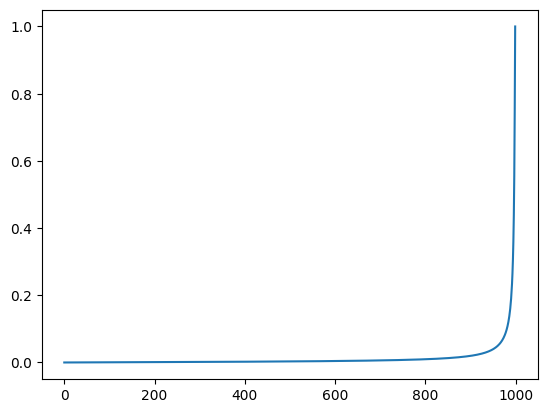

In [6]:
schedule = CosineNoiseSchedule(1000, beta_end=1)
plt.plot(schedule.betas)
# plt.plot(sampler.alphas)
# plt.plot(sampler.alpha_cumprod)
# plt.plot(sampler.alpha_cumprod_prev)
plt.plot([schedule.get_rates(i) for i in range(1000)])
deltas = []
for i in range(1000):
    signal, noise = schedule.get_rates(i)
    deltas.append(jnp.abs(1 - (signal**2 + noise**2)))
print(sum(deltas), schedule.betas[-1], schedule.get_rates(999), schedule.get_rates(1000))

# Data Diffusion Testing

In [ ]:
# Visualize adding some noise to some sample images and then removing it
state = RandomMarkovState(jax.random.PRNGKey(4))
data, _ = get_dataset("oxford_flowers102", batch_size=64, image_scale=64)
images = next(iter(data))
plotImages(images)
noise_level = 400# * jnp.ones((images.shape[0], ), dtype=jnp.int32)
noise_level_max = 1000
schedule = CosineNoiseSchedule(noise_level_max)
state, rng = state.get_random_key()
noise = jax.random.normal(rng, shape=images.shape, dtype=jnp.float64)
noisy_images = schedule.add_noise(images, noise, noise_level)
plotImages(noisy_images)
plotImages(noise)
reconstructed_images = schedule.remove_all_noise(noisy_images, noise, noise_level)
plotImages(reconstructed_images)


# Modeling

## Metrics

## Callbacks

## Model Generator

In [17]:
# Built using the Flax NNX library

# Kernel initializer to use
def kernel_init(scale):
    scale = max(scale, 1e-10)
    return nn.initializers.variance_scaling(scale=scale, mode="fan_in", distribution="truncated_normal")

class WeightStandardizedConv(nn.Module):
    """
    apply weight standardization  https://arxiv.org/abs/1903.10520
    """
    features: int
    kernel_size: Sequence[int] = 3
    strides: Union[None, int, Sequence[int]] = 1
    padding: Any = 1
    dtype: Any = jnp.float32
    param_dtype: Any = jnp.float32


    @nn.compact
    def __call__(self, x):
        """
        Applies a weight standardized convolution to the inputs.

        Args:
          inputs: input data with dimensions (batch, spatial_dims..., features).

        Returns:
          The convolved data.
        """
        x = x.astype(self.dtype)

        conv = nn.Conv(
            features=self.features,
            kernel_size=self.kernel_size,
            strides = self.strides,
            padding=self.padding,
            dtype=self.dtype,
            param_dtype = self.param_dtype,
            parent=None)

        kernel_init = lambda  rng, x: conv.init(rng,x)['params']['kernel']
        bias_init = lambda  rng, x: conv.init(rng,x)['params']['bias']

        # standardize kernel
        kernel = self.param('kernel', kernel_init, x)
        eps = 1e-5 if self.dtype == jnp.float32 else 1e-3
        # reduce over dim_out
        redux = tuple(range(kernel.ndim - 1))
        mean = jnp.mean(kernel, axis=redux, dtype=self.dtype, keepdims=True)
        var = jnp.var(kernel, axis=redux, dtype=self.dtype, keepdims=True)
        standardized_kernel = (kernel - mean)/jnp.sqrt(var + eps)

        bias = self.param('bias',bias_init, x)

        return(conv.apply({'params': {'kernel': standardized_kernel, 'bias': bias}},x))

class PixelShuffle(nn.Module):
    scale: int

    @nn.compact
    def __call__(self, x):
        up = einops.rearrange(
            x,
            pattern="b h w (h2 w2 c) -> b (h h2) (w w2) c",
            h2=self.scale,
            w2=self.scale,
        )
        return up

class TimeEmbedding(nn.Module):
    features:int
    max_timesteps:int=10000

    def setup(self):
        # self.embeddings = nn.Embed(
        #     num_embeddings=max_timesteps, features=out_features
        # )
        half_dim = self.features // 2
        emb = jnp.log(self.max_timesteps) / (half_dim - 1)
        emb = jnp.exp(-emb * jnp.arange(half_dim, dtype=jnp.float32))
        self.embeddings = emb

    def __call__(self, x):
        x = jax.lax.convert_element_type(x, jnp.float32)
        emb = x[:, None] * self.embeddings[None, :]
        emb = jnp.concatenate([jnp.sin(emb), jnp.cos(emb)], axis=-1)
        return emb

class TimeProjection(nn.Module):
    features:int
    activation:Callable=jax.nn.gelu

    @nn.compact
    def __call__(self, x):
        x = nn.DenseGeneral(self.features, kernel_init=kernel_init(1.0))(x)
        x = self.activation(x)
        x = nn.DenseGeneral(self.features, kernel_init=kernel_init(1.0))(x)
        x = self.activation(x)
        return x

class SeparableConv(nn.Module):
    features:int
    kernel_size:tuple=(3, 3)
    strides:tuple=(1, 1)
    use_bias:bool=False
    kernel_init:Callable=kernel_init(1.0)
    padding:str="SAME"

    @nn.compact
    def __call__(self, x):
        in_features = x.shape[-1]
        depthwise = nn.Conv(
            features=in_features, kernel_size=self.kernel_size,
            strides=self.strides, kernel_init=self.kernel_init,
            feature_group_count=in_features, use_bias=self.use_bias,
            padding=self.padding
        )(x)
        pointwise = nn.Conv(
            features=self.features, kernel_size=(1, 1),
            strides=(1, 1), kernel_init=self.kernel_init,
            use_bias=self.use_bias
        )(depthwise)
        return pointwise


class ConvLayer(nn.Module):
    conv_type:str
    features:int
    kernel_size:tuple=(3, 3)
    strides:tuple=(1, 1)
    kernel_init:Callable=kernel_init(1.0)

    def setup(self):
        # conv_type can be "conv", "separable", "conv_transpose"
        if self.conv_type == "conv":
            self.conv = nn.Conv(
                features=self.features,
                kernel_size=self.kernel_size,
                strides=self.strides,
                kernel_init=self.kernel_init,
            )
        elif self.conv_type == "w_conv":
            self.conv = WeightStandardizedConv(
                features=self.features,
                kernel_size=self.kernel_size,
                strides=self.strides,
                padding="SAME",
                dtype=jnp.float32,
                param_dtype=jnp.float32
            )
        elif self.conv_type == "separable":
            self.conv = SeparableConv(
                features=self.features,
                kernel_size=self.kernel_size,
                strides=self.strides,
                kernel_init=self.kernel_init,
            )
        elif self.conv_type == "conv_transpose":
            self.conv = nn.ConvTranspose(
                features=self.features,
                kernel_size=self.kernel_size,
                strides=self.strides,
                kernel_init=self.kernel_init,
            )

    def __call__(self, x):
        return self.conv(x)

class Upsample(nn.Module):
    features:int
    scale:int
    activation:Callable=jax.nn.swish

    @nn.compact
    def __call__(self, x, residual=None):
        out = x
        # out = PixelShuffle(scale=self.scale)(out)
        B, H, W, C = x.shape
        out = jax.image.resize(x, (B, H * self.scale, W * self.scale, C), method="nearest")
        out = ConvLayer(
            "conv",
            features=self.features,
            kernel_size=(3, 3),
            strides=(1, 1),
        )(out)
        if residual is not None:
            out = jnp.concatenate([out, residual], axis=-1)
        return out

class Downsample(nn.Module):
    features:int
    scale:int
    activation:Callable=jax.nn.swish

    @nn.compact
    def __call__(self, x, residual=None):
        out = ConvLayer(
            "conv",
            features=self.features,
            kernel_size=(4, 4),
            strides=(2, 2)
        )(x)
        if residual is not None:
            if residual.shape[1] > out.shape[1]:
                residual = nn.avg_pool(residual, window_shape=(2, 2), strides=(2, 2), padding="SAME")
            out = jnp.concatenate([out, residual], axis=-1)
        return out


def l2norm(t, axis=1, eps=1e-12):
    denom = jnp.clip(jnp.linalg.norm(t, ord=2, axis=axis, keepdims=True), eps)
    out = t/denom
    return (out)

class Attention(nn.Module):
    heads: int = 4
    dim_head: int = 32
    scale: int = 10
    dtype: Any = jnp.float32

    @nn.compact
    def __call__(self, x):
        B, H, W, C = x.shape
        dim = self.dim_head * self.heads

        qkv = nn.Conv(features= dim * 3, kernel_size=(1, 1),
                      use_bias=False, dtype=self.dtype, name='to_qkv.conv_0')(x)  # [B, H, W, dim *3]
        q, k, v = jnp.split(qkv, 3, axis=-1)  # [B, H, W, dim]
        q, k, v = map(lambda t: rearrange(
            t, 'b x y (h d) -> b (x y) h d', h=self.heads), (q, k, v))

        assert q.shape == k.shape == v.shape == (
            B, H * W, self.heads, self.dim_head)

        q, k = map(l2norm, (q, k))

        sim = jnp.einsum('b i h d, b j h d -> b h i j', q, k) * self.scale
        attn = nn.softmax(sim, axis=-1)
        assert attn.shape == (B, self.heads, H * W,  H * W)

        out = jnp.einsum('b h i j , b j h d  -> b h i d', attn, v)
        out = rearrange(out, 'b h (x y) d -> b x y (h d)', x=H)
        assert out.shape == (B, H, W, dim)

        out = nn.Conv(features=C, kernel_size=(1, 1), dtype=self.dtype, name='to_out.conv_0')(out)
        return (out)

class LinearAttention(nn.Module):
    heads: int = 4
    dim_head: int = 32
    dtype: Any = jnp.float32

    @nn.compact
    def __call__(self, x):
        B, H, W, C = x.shape
        dim = self.dim_head * self.heads

        qkv = nn.Conv(
            features=dim * 3,
            kernel_size=(1, 1),
            use_bias=False,
            dtype=self.dtype,
            name='to_qkv.conv_0')(x)  # [B, H, W, dim *3]
        q, k, v = jnp.split(qkv, 3, axis=-1)  # [B, H, W, dim]
        q, k, v = map(lambda t: rearrange(
            t, 'b x y (h d) -> b (x y) h d', h=self.heads), (q, k, v))
        assert q.shape == k.shape == v.shape == (
            B, H * W, self.heads, self.dim_head)
        # compute softmax for q along its embedding dimensions
        q = nn.softmax(q, axis=-1)
        # compute softmax for k along its spatial dimensions
        k = nn.softmax(k, axis=-3)

        q = q/jnp.sqrt(self.dim_head)
        v = v / (H * W)

        context = jnp.einsum('b n h d, b n h e -> b h d e', k, v)
        out = jnp.einsum('b h d e, b n h d -> b h e n', context, q)
        out = rearrange(out, 'b h e (x y) -> b x y (h e)', x=H)
        assert out.shape == (B, H, W, dim)

        out = nn.Conv(features=C, kernel_size=(1, 1),  dtype=self.dtype, name='to_out.conv_0')(out)
        out = nn.LayerNorm(epsilon=1e-5, use_bias=False, dtype=self.dtype, name='to_out.norm_0')(out)
        return (out)

# class AttentionBlock(nn.Module):
#     heads: int = 4
#     dim_head: int = 32
#     use_linear_attention: bool = True
#     dtype: Any = jnp.float32


#     @nn.compact
#     def __call__(self, x):
#       B, H, W, C = x.shape
#       normed_x = nn.LayerNorm(epsilon=1e-5, use_bias=False,dtype=self.dtype)(x)
#       if self.use_linear_attention:
#         attn = LinearAttention(self.heads, self.dim_head, dtype=self.dtype)
#       else:
#         attn = Attention(self.heads, self.dim_head, dtype=self.dtype)
#       out = attn(normed_x)
#       assert out.shape == (B, H, W, C)
#       return(out + x)

class AttentionBlock(nn.Module):
    heads: int = 4
    dim_head: int = 32
    use_linear_attention: bool = True
    dtype: Any = jnp.float32

    @nn.compact
    def __call__(self, x):
        attention = nn.MultiHeadAttention(num_heads=self.heads, precision='high', qkv_features=self.dim_head, decode=False)(x)
        out = x + attention
        return x

class ResidualBlock(nn.Module):
    conv_type:str
    features:int
    kernel_size:tuple=(3, 3)
    strides:tuple=(1, 1)
    padding:str="SAME"
    activation:Callable=jax.nn.swish
    direction:str=None
    res:int=2
    norm_groups:int=8
    kernel_init:Callable=kernel_init(1.0)

    @nn.compact
    def __call__(self, x:jax.Array, temb:jax.Array, extra_features:jax.Array=None):
        residual = x
        out = nn.GroupNorm(8)(x)
        out = self.activation(out)

        out = ConvLayer(
            self.conv_type,
            features=self.features,
            kernel_size=self.kernel_size,
            strides=self.strides,
            kernel_init=self.kernel_init,
            name="conv1"
        )(out)
        out = nn.GroupNorm(8)(out)

        temb = nn.DenseGeneral(features=self.features*2, name="temb_projection")(temb)[:, None, None, :]
        scale, shift = jnp.split(temb, 2, axis=-1)
        out = out * (1 + scale) + shift

        out = self.activation(out)

        out = ConvLayer(
            self.conv_type,
            features=self.features,
            kernel_size=self.kernel_size,
            strides=self.strides,
            kernel_init=self.kernel_init,
            name="conv2"
        )(out)

        if residual.shape != out.shape:
            residual = ConvLayer(
                self.conv_type,
                features=self.features,
                kernel_size=(1, 1),
                strides=1,
                kernel_init=self.kernel_init,
                name="residual_conv"
            )(residual)
        out = out + residual

        out = jnp.concatenate([out, extra_features], axis=-1) if extra_features is not None else out

        return out

class Unet(nn.Module):
    emb_features:int=64*4,
    feature_depths:list=[64, 128, 256, 512],
    attention_configs:list=[{"heads":8}, {"heads":8}, {"heads":8}, {"heads":8}],
    num_res_blocks:int=2,
    num_middle_res_blocks:int=1,
    activation:Callable = jax.nn.swish

    @nn.compact
    def __call__(self, x, temb):
        # print("embedding features", self.emb_features)
        temb = TimeEmbedding(features=self.emb_features)(temb)
        temb = TimeProjection(features=self.emb_features)(temb)
        # print("time embedding", temb.shape)
        feature_depths = self.feature_depths
        attention_configs = self.attention_configs
        x = ConvLayer(
            "conv",
            features=self.feature_depths[0],
            kernel_size=(7, 7),
            strides=(1, 1),
            kernel_init=kernel_init(1.0)
        )(x)
        downs = [x]

        # Downscaling blocks
        for i, (dim_out, attention_config) in enumerate(zip(feature_depths, attention_configs)):
            dim_in = x.shape[-1]
            # dim_in = dim_out
            for j in range(self.num_res_blocks):
                x = ResidualBlock(
                    "conv",
                    name=f"down_{i}_residual_{j}",
                    features=dim_in,
                    kernel_init=kernel_init(1.0),
                    kernel_size=(3, 3),
                    strides=(1, 1),
                    activation=self.activation,
                )(x, temb)
                if attention_config is not None and j == self.num_res_blocks - 1:   # Apply attention only on the last block
                    x = AttentionBlock(heads=attention_config['heads'], name=f"down_{i}_attention_{j}")(x)
                # print("down residual for feature level", i, "is of shape", x.shape, "features", dim_in)
                downs.append(x)
            if i != len(feature_depths) - 1:
                # print("Downsample", i, x.shape)
                x = Downsample(
                    features=dim_out,
                    scale=2,
                    activation=self.activation,
                    name=f"down_{i}_downsample"
                )(x)

        # Middle Blocks
        middle_dim_out = self.feature_depths[-1]
        middle_attention = self.attention_configs[-1]
        x = ConvLayer(
            "conv",
            features=middle_dim_out,
            kernel_size=(3, 3),
            strides=(1, 1),
            kernel_init=kernel_init(1.0),
            name="middle_conv"
        )(x)
        for j in range(self.num_middle_res_blocks):
            x = ResidualBlock(
                "conv",
                name=f"middle_res1_{j}",
                features=middle_dim_out,
                kernel_init=kernel_init(1.0),
                kernel_size=(3, 3),
                strides=(1, 1),
                activation=self.activation,
            )(x, temb)
            if middle_attention is not None and j == self.num_res_blocks - 1:   # Apply attention only on the last block
                x = AttentionBlock(heads=attention_config['heads'], use_linear_attention=False, name=f"middle_attention_{j}")(x)
            x = ResidualBlock(
                "conv",
                name=f"middle_res2_{j}",
                features=middle_dim_out,
                kernel_init=kernel_init(1.0),
                kernel_size=(3, 3),
                strides=(1, 1),
                activation=self.activation,
            )(x, temb)

        # Upscaling Blocks
        for i, (dim_out, attention_config) in enumerate(zip(reversed(feature_depths), reversed(attention_configs))):
            # print("Upscaling", i, "features", dim_out)
            for j in range(self.num_res_blocks):
                x = jnp.concatenate([x, downs.pop()], axis=-1)
                # print("concat==> ", i, "concat", x.shape)
                # kernel_size = (1 + 2 * (j + 1), 1 + 2 * (j + 1))
                kernel_size = (3, 3)
                x = ResidualBlock(
                    "conv",
                    name=f"up_{i}_residual_{j}",
                    features=dim_out,
                    kernel_init=kernel_init(1.0),
                    kernel_size=kernel_size,
                    strides=(1, 1),
                    activation=self.activation,
                )(x, temb)
                if attention_config is not None and j == self.num_res_blocks - 1:   # Apply attention only on the last block
                    x = AttentionBlock(heads=attention_config['heads'], name=f"up_{i}_attention_{j}")(x)
            # print("Upscaling ", i, x.shape)
            if i != len(feature_depths) - 1:
                x = Upsample(
                    features=feature_depths[-i],
                    scale=2,
                    activation=self.activation,
                    name=f"up_{i}_upsample"
                )(x)
        
        x = ConvLayer(
            "conv",
            features=self.feature_depths[0],
            kernel_size=(3, 3),
            strides=(1, 1),
            kernel_init=kernel_init(0.0)
        )(x)
    
        x = jnp.concatenate([x, downs.pop()], axis=-1)

        x = ResidualBlock(
            "conv",
            name="final_residual",
            features=self.feature_depths[0],
            kernel_init=kernel_init(1.0),
            kernel_size=(3, 3),
            strides=(1, 1),
            activation=self.activation,
        )(x, temb)

        print(downs)

        x = nn.GroupNorm(8)(x)
        x = self.activation(x)

        noise_out = ConvLayer(
            "conv",
            features=3,
            kernel_size=(1, 1),
            strides=(1, 1),
            # activation=jax.nn.mish
            kernel_init=kernel_init(0.0)
        )(x)
        return noise_out#, attentions

In [18]:
# model = Unet(emb_features=256,
#     feature_depths=[64, 128, 256, 512],
#     attention_configs=[{"heads":4}, {"heads":4}, {"heads":4}, {"heads":4}],
#     num_res_blocks=2,
#     num_middle_res_blocks=1)
# inp = jnp.ones((1, 64, 64, 3))
# temb = jnp.ones((1,))
# print(model.tabulate(jax.random.key(0), inp, temb, console_kwargs={"width": 200, "force_jupyter":True, }))


# Training

In [19]:
BATCH_SIZE = 16
IMAGE_SIZE = 64

cosine_schedule = CosineNoiseSchedule(1000, beta_end=1)
linear_schedule = LinearNoiseSchedule(1000)

In [20]:
import orbax.checkpoint


@struct.dataclass
class Metrics(metrics.Collection):
  loss: metrics.Average.from_output('loss') # type: ignore

class ModelState():
    model: nn.Module
    params: dict
    noise_schedule: NoiseScheduler
    model_output_transform: DiffusionPredictionTransform

class TrainState(train_state.TrainState):
    rngs:jax.random.PRNGKey
    
    def get_random_key(self):
        rngs, subkey = jax.random.split(self.rngs)
        return self.replace(rngs=rngs), subkey

class DiffusionTrainer:
    state : TrainState
    best_state : TrainState
    best_loss : float
    model : nn.Module
    noise_schedule : NoiseScheduler
    model_output_transform:DiffusionPredictionTransform
    
    def __init__(self, 
                 model:nn.Module, 
                 optimizer: optax.GradientTransformation,
                 noise_schedule:NoiseScheduler,
                 rngs:jax.random.PRNGKey,
                 train_state:TrainState=None,
                 name:str="Diffusion",
                 load_from_checkpoint:bool=False,
                 p2_loss_weight_k:float=1,
                 p2_loss_weight_gamma:float=1,
                 param_transforms:Callable=None,
                 model_output_transform:DiffusionPredictionTransform=EpsilonPredictionTransform()
                 ):
        self.model = model
        self.noise_schedule = noise_schedule
        self.name = name
        self.p2_loss_weights = self.noise_schedule.get_p2_weights(p2_loss_weight_k, p2_loss_weight_gamma)
        self.model_output_transform = model_output_transform

        checkpointer = orbax.checkpoint.PyTreeCheckpointer()
        options = orbax.checkpoint.CheckpointManagerOptions(max_to_keep=4, create=True)
        self.checkpointer = orbax.checkpoint.CheckpointManager(self.checkpoint_path(), checkpointer, options)

        if load_from_checkpoint:
            params = self.load()
        else:
            params = None

        if train_state == None:
            self.init_state(optimizer, rngs, params=params, model=model, param_transforms=param_transforms)
        else:
            train_state.params = params
            self.state = train_state
            self.best_state = train_state

    def init_state(self, 
                   optimizer: optax.GradientTransformation, 
                   rngs:jax.random.PRNGKey,
                   params:dict=None,
                   model:nn.Module=None,
                     param_transforms:Callable=None,
                   ):
        inp = jnp.ones((BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, 3))
        temb = jnp.ones((BATCH_SIZE,))
        rngs, subkey = jax.random.split(rngs)
        if params == None:
            params = model.init(subkey, inp, temb)
        if param_transforms is not None:
            params = param_transforms(params)
        self.best_loss = 1e9
        self.state = TrainState.create(
            apply_fn=model.apply,
            params=params,
            tx=optimizer,
            rngs=rngs,
        )
        self.best_state = self.state

    def checkpoint_path(self):
        experiment_name = self.name
        path = os.path.join(os.path.abspath('./models'), experiment_name)
        if not os.path.exists(path):
            os.makedirs(path)
        return path

    def load(self):
        step = self.checkpointer.latest_step()
        print("Loading model from checkpoint", step)
        ckpt = self.checkpointer.restore(step)
        state = ckpt['state']
        # Convert the state to a TrainState
        self.best_loss = ckpt['best_loss']
        print(f"Loaded model from checkpoint at step {step}", ckpt['best_loss'])
        return state.get('params', None)#, ckpt.get('model', None)

    def save(self, epoch=0, best=False):
        print(f"Saving model at epoch {epoch}")
        state = self.best_state if best else self.state
        # filename = os.path.join(self.checkpoint_path(), f'model_{epoch}' if not best else 'best_model')
        ckpt = {
            'model': self.model,
            'state': state,
            'best_loss': self.best_loss
        }
        save_args = orbax_utils.save_args_from_target(ckpt)
        self.checkpointer.save(epoch, ckpt, save_kwargs={'save_args': save_args})

    def summary(self):
        inp = jnp.ones((1, IMAGE_SIZE, IMAGE_SIZE, 3))
        temb = jnp.ones((1,))
        print(self.model.tabulate(jax.random.key(0), inp, temb, console_kwargs={"width": 200, "force_jupyter":True, }))

    def _define_train_step(self):
        noise_schedule = self.noise_schedule
        model = self.model
        p2_loss_weights = self.p2_loss_weights
        model_output_transform = self.model_output_transform
        @jax.jit
        def train_step(state:TrainState, batch):
            """Train for a single step."""
            images = batch
            noise_level, state = noise_schedule.generate_timesteps(images.shape[0], state)
            state, rngs = state.get_random_key()
            noise:jax.Array = jax.random.normal(rngs, shape=images.shape)
            noisy_images, expected_output = model_output_transform.train_step(images, noise, noise_level, noise_schedule)
            def loss_fn(params):
                preds = model.apply(params, noisy_images, noise_schedule.transform_steps(noise_level))
                nloss = jnp.mean(optax.l2_loss(preds.reshape((1, -1)) - expected_output.reshape((1, -1))), axis=1)
                nloss *= p2_loss_weights[noise_level]
                nloss = jnp.mean(nloss)
                loss = nloss
                return loss
            loss, grads = jax.value_and_grad(loss_fn)(state.params)
            state = state.apply_gradients(grads=grads) 
            return state, loss
        return train_step
    
    def _define_compute_metrics(self):
        @jax.jit
        def compute_metrics(state:TrainState, expected, pred):
            loss = jnp.mean(jnp.square(pred - expected))
            metric_updates = state.metrics.single_from_model_output(loss=loss)
            metrics = state.metrics.merge(metric_updates)
            state = state.replace(metrics=metrics)
            return state
        return compute_metrics

    def fit(self, data, steps_per_epoch, epochs):
        data = iter(data)
        train_step = self._define_train_step()
        compute_metrics = self._define_compute_metrics()
        state = self.state
        for epoch in range(epochs):
            print(f"\nEpoch {epoch+1}/{epochs}")
            start_time = time.time()
            epoch_loss = 0
            with tqdm.tqdm(total=steps_per_epoch, desc=f'\t\tEpoch {epoch+1}', ncols=100, unit='step') as pbar:
                for i in range(steps_per_epoch):
                    batch = next(data)
                    state, loss = train_step(state, batch)
                    epoch_loss += loss
                    if i % 100 == 0:
                        pbar.set_postfix(loss=f'{loss:.4f}')
                        pbar.update(100)
            end_time = time.time()
            self.state = state
            total_time = end_time - start_time
            avg_time_per_step = total_time / steps_per_epoch
            avg_loss = epoch_loss / steps_per_epoch
            if avg_loss < self.best_loss:
                self.best_loss = avg_loss
                self.best_state = state
                self.save(epoch, best=True)
            print(f"\n\tEpoch {epoch+1} completed. Avg Loss: {avg_loss}, Time: {total_time:.2f}s, Best Loss: {self.best_loss}")
        return self.state


In [21]:
# # experiment_name = "{name}_{date}".format(
# #     name="Diffusion", date=datetime.now().strftime("%Y-%m-%d_%H:%M:%S")
# # )
# experiment_name = 'Diffusion_2024-06-11_23:41:18'
# print("Experiment_Name:", experiment_name)
# unet = Unet(emb_features=256, 
#             feature_depths=[64, 96, 128, 192, 256], 
#             attention_configs=[{"num_heads":4, "precision":"high"}, {"num_heads":8, "precision":"high"}, {"num_heads":8, "precision":"high"}, {"num_heads":8, "precision":"high"}, {"num_heads":8, "precision":"high"}],
#             # attention_configs=[None]*4, 
#             num_res_blocks=2,
#             num_middle_res_blocks=2,
#             )

# solver = optax.lookahead(optax.adam(2e-4), sync_period=6, slow_step_size=0.5)
# params_transform = lambda x: optax.LookaheadParams.init_synced(x)
# trainer = DiffusionTrainer(unet, optimizer=solver, 
#                            noise_schedule=cosine_schedule,
#                            rngs=jax.random.PRNGKey(4), 
#                            name=experiment_name,
#                             param_transforms=params_transform,
#                            load_from_checkpoint=True,
#                            )
# #trainer.summary()
# data, datalen = get_dataset("oxford_flowers102", batch_size=BATCH_SIZE, image_scale=IMAGE_SIZE)

In [22]:
experiment_name = "{name}_{date}".format(
    name="Diffusion", date=datetime.now().strftime("%Y-%m-%d_%H:%M:%S")
)
print("Experiment_Name:", experiment_name)
unet = Unet(emb_features=256, 
            feature_depths=[64, 128, 256, 512],
            attention_configs=[{"heads":4}, {"heads":4}, {"heads":4}, {"heads":4}],
            num_res_blocks=2,
            num_middle_res_blocks=1
)
# solver = optax.lookahead(optax.adam(2e-4), sync_period=6, slow_step_size=0.5)
# params_transform = lambda x: optax.LookaheadParams.init_synced(x)
solver = optax.adam(2e-4)
trainer = DiffusionTrainer(unet, optimizer=solver, 
                           noise_schedule=cosine_schedule,
                           rngs=jax.random.PRNGKey(4), 
                           name=experiment_name,
                           model_output_transform=VPredictionTransform(),
                            # param_transforms=params_transform,
                        #    load_from_checkpoint=True,
                           )
#trainer.summary()

Experiment_Name: Diffusion_2024-06-14_10:46:35
[]


In [ ]:
trainer.summary()

In [24]:
data, datalen = get_dataset("oxford_flowers102", batch_size=BATCH_SIZE, image_scale=IMAGE_SIZE)
final_state = trainer.fit(data, datalen // BATCH_SIZE, epochs=1000)

		Epoch 997: 600step [00:21, 27.64step/s, loss=0.0266]                                              



	Epoch 997 completed. Avg Loss: 0.02738419733941555, Time: 21.71s, Best Loss: 0.026390790939331055

Epoch 998/1000


		Epoch 998: 600step [00:21, 27.66step/s, loss=0.0168]                                              



	Epoch 998 completed. Avg Loss: 0.026708658784627914, Time: 21.70s, Best Loss: 0.026390790939331055

Epoch 999/1000


		Epoch 999: 600step [00:21, 27.78step/s, loss=0.0281]                                              



	Epoch 999 completed. Avg Loss: 0.027463030070066452, Time: 21.60s, Best Loss: 0.026390790939331055

Epoch 1000/1000


		Epoch 1000: 600step [00:21, 27.74step/s, loss=0.0236]                                             


	Epoch 1000 completed. Avg Loss: 0.027076976373791695, Time: 21.63s, Best Loss: 0.026390790939331055


In [62]:
data, datalen = get_dataset("oxford_flowers102", batch_size=BATCH_SIZE, image_scale=IMAGE_SIZE)
final_state = trainer.fit(data, datalen // BATCH_SIZE, epochs=1000)


Epoch 1/1000


		Epoch 1:   0%|                                                          | 0/511 [00:00<?, ?step/s]E0614 00:55:12.621232  473236 gpu_timer.cc:183] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0614 00:55:12.703889  473236 gpu_timer.cc:183] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0614 00:55:12.785785  473236 gpu_timer.cc:183] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
		Epoch 1: 600step [00:28, 21.01step/s, loss=0.0448]                                                


Saving model at epoch 0

	Epoch 1 completed. Avg Loss: 0.07749170064926147, Time: 28.56s, Best Loss: 0.07749170064926147

Epoch 2/1000


		Epoch 2: 600step [00:13, 43.80step/s, loss=0.0471]                                                


Saving model at epoch 1

	Epoch 2 completed. Avg Loss: 0.04629381000995636, Time: 13.70s, Best Loss: 0.04629381000995636

Epoch 3/1000


		Epoch 3: 600step [00:13, 43.77step/s, loss=0.0516]                                                


Saving model at epoch 2

	Epoch 3 completed. Avg Loss: 0.043170005083084106, Time: 13.71s, Best Loss: 0.043170005083084106

Epoch 4/1000


		Epoch 4: 600step [00:13, 43.85step/s, loss=0.0288]                                                


Saving model at epoch 3

	Epoch 4 completed. Avg Loss: 0.04057053476572037, Time: 13.68s, Best Loss: 0.04057053476572037

Epoch 5/1000


		Epoch 5: 600step [00:14, 42.81step/s, loss=0.0315]                                                


Saving model at epoch 4

	Epoch 5 completed. Avg Loss: 0.03995306417346001, Time: 14.02s, Best Loss: 0.03995306417346001

Epoch 6/1000


		Epoch 6: 600step [00:14, 42.26step/s, loss=0.0321]                                                


Saving model at epoch 5

	Epoch 6 completed. Avg Loss: 0.03827348351478577, Time: 14.20s, Best Loss: 0.03827348351478577

Epoch 7/1000


		Epoch 7: 600step [00:14, 42.33step/s, loss=0.0240]                                                


Saving model at epoch 6

	Epoch 7 completed. Avg Loss: 0.03707253932952881, Time: 14.18s, Best Loss: 0.03707253932952881

Epoch 8/1000


		Epoch 8: 600step [00:13, 43.96step/s, loss=0.0556]                                                


Saving model at epoch 7

	Epoch 8 completed. Avg Loss: 0.03557683527469635, Time: 13.65s, Best Loss: 0.03557683527469635

Epoch 9/1000


		Epoch 9: 600step [00:13, 43.52step/s, loss=0.0359]                                                



	Epoch 9 completed. Avg Loss: 0.036063533276319504, Time: 13.79s, Best Loss: 0.03557683527469635

Epoch 10/1000


		Epoch 10: 600step [00:14, 42.76step/s, loss=0.0243]                                               


Saving model at epoch 9

	Epoch 10 completed. Avg Loss: 0.03502628952264786, Time: 14.03s, Best Loss: 0.03502628952264786

Epoch 11/1000


		Epoch 11: 600step [00:13, 44.04step/s, loss=0.0420]                                               


Saving model at epoch 10

	Epoch 11 completed. Avg Loss: 0.034526240080595016, Time: 13.63s, Best Loss: 0.034526240080595016

Epoch 12/1000


		Epoch 12: 600step [00:13, 43.80step/s, loss=0.0386]                                               


Saving model at epoch 11

	Epoch 12 completed. Avg Loss: 0.03381797671318054, Time: 13.70s, Best Loss: 0.03381797671318054

Epoch 13/1000


		Epoch 13: 600step [00:14, 42.85step/s, loss=0.0369]                                               



	Epoch 13 completed. Avg Loss: 0.03445526957511902, Time: 14.00s, Best Loss: 0.03381797671318054

Epoch 14/1000


		Epoch 14: 600step [00:13, 43.28step/s, loss=0.0425]                                               


Saving model at epoch 13

	Epoch 14 completed. Avg Loss: 0.03377095237374306, Time: 13.87s, Best Loss: 0.03377095237374306

Epoch 15/1000


		Epoch 15: 600step [00:13, 43.91step/s, loss=0.0426]                                               


Saving model at epoch 14

	Epoch 15 completed. Avg Loss: 0.033522043377161026, Time: 13.67s, Best Loss: 0.033522043377161026

Epoch 16/1000


		Epoch 16: 600step [00:14, 42.55step/s, loss=0.0284]                                               



	Epoch 16 completed. Avg Loss: 0.033827412873506546, Time: 14.10s, Best Loss: 0.033522043377161026

Epoch 17/1000


		Epoch 17: 600step [00:13, 44.20step/s, loss=0.0180]                                               


Saving model at epoch 16

	Epoch 17 completed. Avg Loss: 0.033278316259384155, Time: 13.58s, Best Loss: 0.033278316259384155

Epoch 18/1000


		Epoch 18: 600step [00:13, 43.96step/s, loss=0.0275]                                               


Saving model at epoch 17

	Epoch 18 completed. Avg Loss: 0.03265758976340294, Time: 13.65s, Best Loss: 0.03265758976340294

Epoch 19/1000


		Epoch 19: 600step [00:11, 50.68step/s, loss=0.0495]                                               



	Epoch 19 completed. Avg Loss: 0.033221252262592316, Time: 11.84s, Best Loss: 0.03265758976340294

Epoch 20/1000


		Epoch 20: 600step [00:11, 50.77step/s, loss=0.0402]                                               


Saving model at epoch 19

	Epoch 20 completed. Avg Loss: 0.031582266092300415, Time: 11.82s, Best Loss: 0.031582266092300415

Epoch 21/1000


		Epoch 21: 600step [00:12, 49.98step/s, loss=0.0275]                                               



	Epoch 21 completed. Avg Loss: 0.032662730664014816, Time: 12.01s, Best Loss: 0.031582266092300415

Epoch 22/1000


		Epoch 22: 600step [00:13, 44.66step/s, loss=0.0238]                                               



	Epoch 22 completed. Avg Loss: 0.03250119835138321, Time: 13.44s, Best Loss: 0.031582266092300415

Epoch 23/1000


		Epoch 23: 600step [00:11, 50.11step/s, loss=0.0308]                                               



	Epoch 23 completed. Avg Loss: 0.032495010644197464, Time: 11.98s, Best Loss: 0.031582266092300415

Epoch 24/1000


		Epoch 24: 600step [00:12, 48.85step/s, loss=0.0291]                                               



	Epoch 24 completed. Avg Loss: 0.03239637613296509, Time: 12.28s, Best Loss: 0.031582266092300415

Epoch 25/1000


		Epoch 25: 600step [00:12, 47.78step/s, loss=0.0371]                                               


Saving model at epoch 24

	Epoch 25 completed. Avg Loss: 0.0314798429608345, Time: 12.56s, Best Loss: 0.0314798429608345

Epoch 26/1000


		Epoch 26: 600step [00:12, 49.91step/s, loss=0.0382]                                               



	Epoch 26 completed. Avg Loss: 0.03177968040108681, Time: 12.02s, Best Loss: 0.0314798429608345

Epoch 27/1000


		Epoch 27: 600step [00:12, 48.52step/s, loss=0.0211]                                               


Saving model at epoch 26

	Epoch 27 completed. Avg Loss: 0.030798645690083504, Time: 12.37s, Best Loss: 0.030798645690083504

Epoch 28/1000


		Epoch 28: 600step [00:11, 50.39step/s, loss=0.0413]                                               



	Epoch 28 completed. Avg Loss: 0.03229132294654846, Time: 11.91s, Best Loss: 0.030798645690083504

Epoch 29/1000


		Epoch 29: 600step [00:12, 49.24step/s, loss=0.0331]                                               



	Epoch 29 completed. Avg Loss: 0.031198356300592422, Time: 12.19s, Best Loss: 0.030798645690083504

Epoch 30/1000


		Epoch 30: 600step [00:11, 50.40step/s, loss=0.0258]                                               



	Epoch 30 completed. Avg Loss: 0.031240001320838928, Time: 11.91s, Best Loss: 0.030798645690083504

Epoch 31/1000


		Epoch 31: 600step [00:11, 50.76step/s, loss=0.0361]                                               



	Epoch 31 completed. Avg Loss: 0.031325455754995346, Time: 11.82s, Best Loss: 0.030798645690083504

Epoch 32/1000


		Epoch 32: 600step [00:11, 50.56step/s, loss=0.0370]                                               



	Epoch 32 completed. Avg Loss: 0.031137116253376007, Time: 11.87s, Best Loss: 0.030798645690083504

Epoch 33/1000


		Epoch 33: 600step [00:11, 50.68step/s, loss=0.0322]                                               



	Epoch 33 completed. Avg Loss: 0.03127989172935486, Time: 11.84s, Best Loss: 0.030798645690083504

Epoch 34/1000


		Epoch 34: 600step [00:12, 47.97step/s, loss=0.0263]                                               



	Epoch 34 completed. Avg Loss: 0.03082805871963501, Time: 12.51s, Best Loss: 0.030798645690083504

Epoch 35/1000


		Epoch 35: 600step [00:12, 47.64step/s, loss=0.0248]                                               



	Epoch 35 completed. Avg Loss: 0.031302545219659805, Time: 12.60s, Best Loss: 0.030798645690083504

Epoch 36/1000


		Epoch 36: 600step [00:12, 49.61step/s, loss=0.0344]                                               



	Epoch 36 completed. Avg Loss: 0.030965296551585197, Time: 12.10s, Best Loss: 0.030798645690083504

Epoch 37/1000


		Epoch 37: 600step [00:11, 50.24step/s, loss=0.0319]                                               



	Epoch 37 completed. Avg Loss: 0.031085127964615822, Time: 11.94s, Best Loss: 0.030798645690083504

Epoch 38/1000


		Epoch 38: 600step [00:11, 50.56step/s, loss=0.0452]                                               



	Epoch 38 completed. Avg Loss: 0.030833398923277855, Time: 11.87s, Best Loss: 0.030798645690083504

Epoch 39/1000


		Epoch 39: 600step [00:11, 50.58step/s, loss=0.0247]                                               



	Epoch 39 completed. Avg Loss: 0.03112974390387535, Time: 11.86s, Best Loss: 0.030798645690083504

Epoch 40/1000


		Epoch 40: 600step [00:12, 48.35step/s, loss=0.0257]                                               


Saving model at epoch 39

	Epoch 40 completed. Avg Loss: 0.030362728983163834, Time: 12.41s, Best Loss: 0.030362728983163834

Epoch 41/1000


		Epoch 41: 600step [00:12, 49.92step/s, loss=0.0254]                                               



	Epoch 41 completed. Avg Loss: 0.03065783903002739, Time: 12.02s, Best Loss: 0.030362728983163834

Epoch 42/1000


		Epoch 42: 600step [00:12, 49.41step/s, loss=0.0359]                                               



	Epoch 42 completed. Avg Loss: 0.030606821179389954, Time: 12.14s, Best Loss: 0.030362728983163834

Epoch 43/1000


		Epoch 43: 600step [00:12, 49.99step/s, loss=0.0232]                                               



	Epoch 43 completed. Avg Loss: 0.030589506030082703, Time: 12.00s, Best Loss: 0.030362728983163834

Epoch 44/1000


		Epoch 44: 600step [00:11, 50.57step/s, loss=0.0327]                                               



	Epoch 44 completed. Avg Loss: 0.031067924574017525, Time: 11.87s, Best Loss: 0.030362728983163834

Epoch 45/1000


		Epoch 45: 600step [00:11, 50.54step/s, loss=0.0374]                                               


Saving model at epoch 44

	Epoch 45 completed. Avg Loss: 0.02998937852680683, Time: 11.87s, Best Loss: 0.02998937852680683

Epoch 46/1000


		Epoch 46: 600step [00:11, 50.36step/s, loss=0.0268]                                               



	Epoch 46 completed. Avg Loss: 0.03031216748058796, Time: 11.91s, Best Loss: 0.02998937852680683

Epoch 47/1000


		Epoch 47: 600step [00:12, 48.64step/s, loss=0.0404]                                               



	Epoch 47 completed. Avg Loss: 0.031109288334846497, Time: 12.34s, Best Loss: 0.02998937852680683

Epoch 48/1000


		Epoch 48: 600step [00:12, 49.12step/s, loss=0.0283]                                               



	Epoch 48 completed. Avg Loss: 0.03048931434750557, Time: 12.22s, Best Loss: 0.02998937852680683

Epoch 49/1000


		Epoch 49: 600step [00:12, 47.15step/s, loss=0.0351]                                               



	Epoch 49 completed. Avg Loss: 0.030839649960398674, Time: 12.73s, Best Loss: 0.02998937852680683

Epoch 50/1000


		Epoch 50: 600step [00:11, 50.28step/s, loss=0.0243]                                               



	Epoch 50 completed. Avg Loss: 0.0304613895714283, Time: 11.94s, Best Loss: 0.02998937852680683

Epoch 51/1000


		Epoch 51: 600step [00:12, 49.72step/s, loss=0.0289]                                               



	Epoch 51 completed. Avg Loss: 0.03003678098320961, Time: 12.07s, Best Loss: 0.02998937852680683

Epoch 52/1000


		Epoch 52: 600step [00:12, 48.59step/s, loss=0.0454]                                               



	Epoch 52 completed. Avg Loss: 0.030493270605802536, Time: 12.35s, Best Loss: 0.02998937852680683

Epoch 53/1000


		Epoch 53: 600step [00:12, 48.64step/s, loss=0.0273]                                               



	Epoch 53 completed. Avg Loss: 0.030226361006498337, Time: 12.34s, Best Loss: 0.02998937852680683

Epoch 54/1000


		Epoch 54: 600step [00:12, 49.89step/s, loss=0.0291]                                               


Saving model at epoch 53

	Epoch 54 completed. Avg Loss: 0.029971500858664513, Time: 12.03s, Best Loss: 0.029971500858664513

Epoch 55/1000


		Epoch 55: 600step [00:12, 48.41step/s, loss=0.0249]                                               


Saving model at epoch 54

	Epoch 55 completed. Avg Loss: 0.029442742466926575, Time: 12.40s, Best Loss: 0.029442742466926575

Epoch 56/1000


		Epoch 56: 600step [00:12, 47.14step/s, loss=0.0369]                                               



	Epoch 56 completed. Avg Loss: 0.030024010688066483, Time: 12.73s, Best Loss: 0.029442742466926575

Epoch 57/1000


		Epoch 57: 600step [00:12, 46.88step/s, loss=0.0230]                                               



	Epoch 57 completed. Avg Loss: 0.02988523244857788, Time: 12.80s, Best Loss: 0.029442742466926575

Epoch 58/1000


		Epoch 58: 600step [00:12, 49.30step/s, loss=0.0272]                                               



	Epoch 58 completed. Avg Loss: 0.029970219358801842, Time: 12.17s, Best Loss: 0.029442742466926575

Epoch 59/1000


		Epoch 59: 600step [00:12, 48.29step/s, loss=0.0261]                                               



	Epoch 59 completed. Avg Loss: 0.030221618711948395, Time: 12.43s, Best Loss: 0.029442742466926575

Epoch 60/1000


		Epoch 60: 600step [00:12, 47.95step/s, loss=0.0294]                                               



	Epoch 60 completed. Avg Loss: 0.030206963419914246, Time: 12.51s, Best Loss: 0.029442742466926575

Epoch 61/1000


		Epoch 61: 600step [00:12, 47.98step/s, loss=0.0220]                                               



	Epoch 61 completed. Avg Loss: 0.030054068192839622, Time: 12.51s, Best Loss: 0.029442742466926575

Epoch 62/1000


		Epoch 62: 600step [00:12, 48.92step/s, loss=0.0329]                                               



	Epoch 62 completed. Avg Loss: 0.029957974329590797, Time: 12.27s, Best Loss: 0.029442742466926575

Epoch 63/1000


		Epoch 63: 600step [00:12, 49.26step/s, loss=0.0317]                                               



	Epoch 63 completed. Avg Loss: 0.02977728843688965, Time: 12.18s, Best Loss: 0.029442742466926575

Epoch 64/1000


		Epoch 64: 600step [00:11, 50.03step/s, loss=0.0364]                                               



	Epoch 64 completed. Avg Loss: 0.029620008543133736, Time: 11.99s, Best Loss: 0.029442742466926575

Epoch 65/1000


		Epoch 65: 600step [00:12, 48.56step/s, loss=0.0406]                                               



	Epoch 65 completed. Avg Loss: 0.030285479500889778, Time: 12.36s, Best Loss: 0.029442742466926575

Epoch 66/1000


		Epoch 66: 600step [00:12, 46.87step/s, loss=0.0312]                                               



	Epoch 66 completed. Avg Loss: 0.03036065585911274, Time: 12.80s, Best Loss: 0.029442742466926575

Epoch 67/1000


		Epoch 67: 600step [00:13, 45.02step/s, loss=0.0360]                                               



	Epoch 67 completed. Avg Loss: 0.02973254583775997, Time: 13.33s, Best Loss: 0.029442742466926575

Epoch 68/1000


		Epoch 68: 600step [00:12, 48.04step/s, loss=0.0289]                                               



	Epoch 68 completed. Avg Loss: 0.030127471312880516, Time: 12.49s, Best Loss: 0.029442742466926575

Epoch 69/1000


		Epoch 69: 600step [00:12, 46.99step/s, loss=0.0343]                                               



	Epoch 69 completed. Avg Loss: 0.029825368896126747, Time: 12.77s, Best Loss: 0.029442742466926575

Epoch 70/1000


		Epoch 70: 600step [00:12, 49.36step/s, loss=0.0242]                                               



	Epoch 70 completed. Avg Loss: 0.03031924180686474, Time: 12.16s, Best Loss: 0.029442742466926575

Epoch 71/1000


		Epoch 71: 600step [00:12, 48.92step/s, loss=0.0266]                                               



	Epoch 71 completed. Avg Loss: 0.029529672116041183, Time: 12.27s, Best Loss: 0.029442742466926575

Epoch 72/1000


		Epoch 72: 600step [00:12, 48.91step/s, loss=0.0254]                                               



	Epoch 72 completed. Avg Loss: 0.029782667756080627, Time: 12.27s, Best Loss: 0.029442742466926575

Epoch 73/1000


		Epoch 73: 600step [00:12, 47.29step/s, loss=0.0218]                                               



	Epoch 73 completed. Avg Loss: 0.029603449627757072, Time: 12.69s, Best Loss: 0.029442742466926575

Epoch 74/1000


		Epoch 74: 600step [00:12, 47.55step/s, loss=0.0322]                                               



	Epoch 74 completed. Avg Loss: 0.03029041551053524, Time: 12.62s, Best Loss: 0.029442742466926575

Epoch 75/1000


		Epoch 75: 600step [00:12, 47.60step/s, loss=0.0216]                                               



	Epoch 75 completed. Avg Loss: 0.030109476298093796, Time: 12.61s, Best Loss: 0.029442742466926575

Epoch 76/1000


		Epoch 76: 600step [00:12, 48.97step/s, loss=0.0363]                                               



	Epoch 76 completed. Avg Loss: 0.02962840534746647, Time: 12.25s, Best Loss: 0.029442742466926575

Epoch 77/1000


		Epoch 77: 600step [00:11, 50.84step/s, loss=0.0296]                                               



	Epoch 77 completed. Avg Loss: 0.03005244955420494, Time: 11.80s, Best Loss: 0.029442742466926575

Epoch 78/1000


		Epoch 78: 600step [00:11, 50.63step/s, loss=0.0234]                                               



	Epoch 78 completed. Avg Loss: 0.029981667175889015, Time: 11.85s, Best Loss: 0.029442742466926575

Epoch 79/1000


		Epoch 79: 600step [00:12, 49.87step/s, loss=0.0291]                                               



	Epoch 79 completed. Avg Loss: 0.029685555025935173, Time: 12.03s, Best Loss: 0.029442742466926575

Epoch 80/1000


		Epoch 80: 600step [00:13, 45.06step/s, loss=0.0259]                                               



	Epoch 80 completed. Avg Loss: 0.030370939522981644, Time: 13.32s, Best Loss: 0.029442742466926575

Epoch 81/1000


		Epoch 81: 600step [00:13, 44.43step/s, loss=0.0364]                                               



	Epoch 81 completed. Avg Loss: 0.02987302653491497, Time: 13.50s, Best Loss: 0.029442742466926575

Epoch 82/1000


		Epoch 82: 600step [00:14, 42.58step/s, loss=0.0242]                                               


Saving model at epoch 81

	Epoch 82 completed. Avg Loss: 0.028966138139367104, Time: 14.09s, Best Loss: 0.028966138139367104

Epoch 83/1000


		Epoch 83: 600step [00:14, 40.65step/s, loss=0.0266]                                               



	Epoch 83 completed. Avg Loss: 0.029590941965579987, Time: 14.76s, Best Loss: 0.028966138139367104

Epoch 84/1000


		Epoch 84: 600step [00:14, 41.29step/s, loss=0.0336]                                               



	Epoch 84 completed. Avg Loss: 0.029565386474132538, Time: 14.53s, Best Loss: 0.028966138139367104

Epoch 85/1000


		Epoch 85: 600step [00:14, 41.78step/s, loss=0.0223]                                               



	Epoch 85 completed. Avg Loss: 0.030290132388472557, Time: 14.36s, Best Loss: 0.028966138139367104

Epoch 86/1000


		Epoch 86: 600step [00:13, 43.62step/s, loss=0.0280]                                               



	Epoch 86 completed. Avg Loss: 0.0292891226708889, Time: 13.76s, Best Loss: 0.028966138139367104

Epoch 87/1000


		Epoch 87: 600step [00:13, 43.63step/s, loss=0.0314]                                               



	Epoch 87 completed. Avg Loss: 0.029700729995965958, Time: 13.75s, Best Loss: 0.028966138139367104

Epoch 88/1000


		Epoch 88: 600step [00:14, 42.85step/s, loss=0.0270]                                               



	Epoch 88 completed. Avg Loss: 0.029095420613884926, Time: 14.00s, Best Loss: 0.028966138139367104

Epoch 89/1000


		Epoch 89: 600step [00:14, 42.70step/s, loss=0.0258]                                               


Saving model at epoch 88

	Epoch 89 completed. Avg Loss: 0.02883085049688816, Time: 14.05s, Best Loss: 0.02883085049688816

Epoch 90/1000


		Epoch 90: 600step [00:13, 46.03step/s, loss=0.0222]                                               



	Epoch 90 completed. Avg Loss: 0.029820391908288002, Time: 13.04s, Best Loss: 0.02883085049688816

Epoch 91/1000


		Epoch 91: 600step [00:12, 46.16step/s, loss=0.0315]                                               



	Epoch 91 completed. Avg Loss: 0.030075235292315483, Time: 13.00s, Best Loss: 0.02883085049688816

Epoch 92/1000


		Epoch 92: 600step [00:13, 45.64step/s, loss=0.0228]                                               



	Epoch 92 completed. Avg Loss: 0.02942275069653988, Time: 13.15s, Best Loss: 0.02883085049688816

Epoch 93/1000


		Epoch 93: 600step [00:13, 44.50step/s, loss=0.0296]                                               



	Epoch 93 completed. Avg Loss: 0.02971656620502472, Time: 13.49s, Best Loss: 0.02883085049688816

Epoch 94/1000


		Epoch 94: 600step [00:13, 45.13step/s, loss=0.0224]                                               



	Epoch 94 completed. Avg Loss: 0.029466895386576653, Time: 13.30s, Best Loss: 0.02883085049688816

Epoch 95/1000


		Epoch 95: 600step [00:13, 45.25step/s, loss=0.0308]                                               



	Epoch 95 completed. Avg Loss: 0.029794340953230858, Time: 13.26s, Best Loss: 0.02883085049688816

Epoch 96/1000


		Epoch 96: 600step [00:13, 44.98step/s, loss=0.0408]                                               



	Epoch 96 completed. Avg Loss: 0.029868708923459053, Time: 13.34s, Best Loss: 0.02883085049688816

Epoch 97/1000


		Epoch 97: 600step [00:13, 45.58step/s, loss=0.0220]                                               



	Epoch 97 completed. Avg Loss: 0.030081268399953842, Time: 13.16s, Best Loss: 0.02883085049688816

Epoch 98/1000


		Epoch 98: 600step [00:13, 45.09step/s, loss=0.0259]                                               



	Epoch 98 completed. Avg Loss: 0.029085028916597366, Time: 13.31s, Best Loss: 0.02883085049688816

Epoch 99/1000


		Epoch 99: 600step [00:12, 46.25step/s, loss=0.0366]                                               



	Epoch 99 completed. Avg Loss: 0.029162080958485603, Time: 12.97s, Best Loss: 0.02883085049688816

Epoch 100/1000


		Epoch 100: 600step [00:13, 45.07step/s, loss=0.0300]                                              



	Epoch 100 completed. Avg Loss: 0.02995990961790085, Time: 13.31s, Best Loss: 0.02883085049688816

Epoch 101/1000


		Epoch 101: 600step [00:13, 44.98step/s, loss=0.0227]                                              



	Epoch 101 completed. Avg Loss: 0.029629981145262718, Time: 13.34s, Best Loss: 0.02883085049688816

Epoch 102/1000


		Epoch 102: 600step [00:13, 45.51step/s, loss=0.0396]                                              



	Epoch 102 completed. Avg Loss: 0.029601993039250374, Time: 13.19s, Best Loss: 0.02883085049688816

Epoch 103/1000


		Epoch 103: 600step [00:13, 45.98step/s, loss=0.0303]                                              



	Epoch 103 completed. Avg Loss: 0.02926158532500267, Time: 13.05s, Best Loss: 0.02883085049688816

Epoch 104/1000


		Epoch 104: 600step [00:12, 46.23step/s, loss=0.0196]                                              



	Epoch 104 completed. Avg Loss: 0.02963598258793354, Time: 12.98s, Best Loss: 0.02883085049688816

Epoch 105/1000


		Epoch 105: 600step [00:13, 45.83step/s, loss=0.0270]                                              



	Epoch 105 completed. Avg Loss: 0.029840534552931786, Time: 13.09s, Best Loss: 0.02883085049688816

Epoch 106/1000


		Epoch 106: 600step [00:13, 44.98step/s, loss=0.0363]                                              


Saving model at epoch 105

	Epoch 106 completed. Avg Loss: 0.02830115333199501, Time: 13.34s, Best Loss: 0.02830115333199501

Epoch 107/1000


		Epoch 107: 600step [00:13, 43.67step/s, loss=0.0242]                                              



	Epoch 107 completed. Avg Loss: 0.02962120622396469, Time: 13.74s, Best Loss: 0.02830115333199501

Epoch 108/1000


		Epoch 108: 600step [00:14, 42.35step/s, loss=0.0296]                                              



	Epoch 108 completed. Avg Loss: 0.02964993752539158, Time: 14.17s, Best Loss: 0.02830115333199501

Epoch 109/1000


		Epoch 109: 600step [00:13, 44.35step/s, loss=0.0275]                                              



	Epoch 109 completed. Avg Loss: 0.02900179848074913, Time: 13.53s, Best Loss: 0.02830115333199501

Epoch 110/1000


		Epoch 110: 600step [00:13, 45.05step/s, loss=0.0267]                                              



	Epoch 110 completed. Avg Loss: 0.029530460014939308, Time: 13.32s, Best Loss: 0.02830115333199501

Epoch 111/1000


		Epoch 111: 600step [00:13, 45.86step/s, loss=0.0301]                                              



	Epoch 111 completed. Avg Loss: 0.028971759602427483, Time: 13.09s, Best Loss: 0.02830115333199501

Epoch 112/1000


		Epoch 112: 600step [00:13, 45.37step/s, loss=0.0252]                                              



	Epoch 112 completed. Avg Loss: 0.02924627624452114, Time: 13.23s, Best Loss: 0.02830115333199501

Epoch 113/1000


		Epoch 113: 600step [00:13, 44.64step/s, loss=0.0313]                                              



	Epoch 113 completed. Avg Loss: 0.029058726504445076, Time: 13.44s, Best Loss: 0.02830115333199501

Epoch 114/1000


		Epoch 114: 600step [00:13, 45.22step/s, loss=0.0288]                                              



	Epoch 114 completed. Avg Loss: 0.02952638640999794, Time: 13.27s, Best Loss: 0.02830115333199501

Epoch 115/1000


		Epoch 115: 600step [00:13, 45.10step/s, loss=0.0344]                                              



	Epoch 115 completed. Avg Loss: 0.02965899370610714, Time: 13.31s, Best Loss: 0.02830115333199501

Epoch 116/1000


		Epoch 116: 600step [00:13, 45.20step/s, loss=0.0251]                                              



	Epoch 116 completed. Avg Loss: 0.029088443145155907, Time: 13.28s, Best Loss: 0.02830115333199501

Epoch 117/1000


		Epoch 117: 600step [00:13, 46.03step/s, loss=0.0231]                                              



	Epoch 117 completed. Avg Loss: 0.029475266113877296, Time: 13.04s, Best Loss: 0.02830115333199501

Epoch 118/1000


		Epoch 118: 600step [00:13, 44.55step/s, loss=0.0392]                                              



	Epoch 118 completed. Avg Loss: 0.029835352674126625, Time: 13.47s, Best Loss: 0.02830115333199501

Epoch 119/1000


		Epoch 119: 600step [00:13, 43.25step/s, loss=0.0488]                                              



	Epoch 119 completed. Avg Loss: 0.0293726846575737, Time: 13.87s, Best Loss: 0.02830115333199501

Epoch 120/1000


		Epoch 120: 600step [00:13, 42.98step/s, loss=0.0274]                                              



	Epoch 120 completed. Avg Loss: 0.02879466488957405, Time: 13.96s, Best Loss: 0.02830115333199501

Epoch 121/1000


		Epoch 121: 600step [00:13, 43.95step/s, loss=0.0246]                                              



	Epoch 121 completed. Avg Loss: 0.029163546860218048, Time: 13.65s, Best Loss: 0.02830115333199501

Epoch 122/1000


		Epoch 122: 600step [00:12, 46.94step/s, loss=0.0301]                                              



	Epoch 122 completed. Avg Loss: 0.02939877100288868, Time: 12.78s, Best Loss: 0.02830115333199501

Epoch 123/1000


		Epoch 123: 600step [00:13, 44.63step/s, loss=0.0302]                                              



	Epoch 123 completed. Avg Loss: 0.0287152286618948, Time: 13.45s, Best Loss: 0.02830115333199501

Epoch 124/1000


		Epoch 124: 600step [00:13, 42.96step/s, loss=0.0192]                                              



	Epoch 124 completed. Avg Loss: 0.02902827039361, Time: 13.97s, Best Loss: 0.02830115333199501

Epoch 125/1000


		Epoch 125: 600step [00:13, 43.43step/s, loss=0.0368]                                              



	Epoch 125 completed. Avg Loss: 0.028796041384339333, Time: 13.82s, Best Loss: 0.02830115333199501

Epoch 126/1000


		Epoch 126: 600step [00:13, 42.91step/s, loss=0.0434]                                              



	Epoch 126 completed. Avg Loss: 0.029082391411066055, Time: 13.99s, Best Loss: 0.02830115333199501

Epoch 127/1000


		Epoch 127: 600step [00:13, 43.47step/s, loss=0.0320]                                              



	Epoch 127 completed. Avg Loss: 0.029544223099946976, Time: 13.80s, Best Loss: 0.02830115333199501

Epoch 128/1000


		Epoch 128: 600step [00:13, 43.38step/s, loss=0.0240]                                              



	Epoch 128 completed. Avg Loss: 0.02942183054983616, Time: 13.83s, Best Loss: 0.02830115333199501

Epoch 129/1000


		Epoch 129: 600step [00:13, 43.07step/s, loss=0.0248]                                              



	Epoch 129 completed. Avg Loss: 0.0287320576608181, Time: 13.93s, Best Loss: 0.02830115333199501

Epoch 130/1000


		Epoch 130: 600step [00:13, 43.10step/s, loss=0.0305]                                              



	Epoch 130 completed. Avg Loss: 0.02912706322968006, Time: 13.92s, Best Loss: 0.02830115333199501

Epoch 131/1000


		Epoch 131: 600step [00:13, 43.38step/s, loss=0.0306]                                              



	Epoch 131 completed. Avg Loss: 0.028851710259914398, Time: 13.83s, Best Loss: 0.02830115333199501

Epoch 132/1000


		Epoch 132: 600step [00:13, 43.29step/s, loss=0.0249]                                              



	Epoch 132 completed. Avg Loss: 0.029061881825327873, Time: 13.86s, Best Loss: 0.02830115333199501

Epoch 133/1000


		Epoch 133: 600step [00:13, 42.94step/s, loss=0.0291]                                              



	Epoch 133 completed. Avg Loss: 0.029205016791820526, Time: 13.97s, Best Loss: 0.02830115333199501

Epoch 134/1000


		Epoch 134: 600step [00:13, 43.96step/s, loss=0.0409]                                              



	Epoch 134 completed. Avg Loss: 0.02953813038766384, Time: 13.65s, Best Loss: 0.02830115333199501

Epoch 135/1000


		Epoch 135: 600step [00:13, 42.92step/s, loss=0.0286]                                              



	Epoch 135 completed. Avg Loss: 0.028936931863427162, Time: 13.98s, Best Loss: 0.02830115333199501

Epoch 136/1000


		Epoch 136: 600step [00:13, 43.27step/s, loss=0.0361]                                              



	Epoch 136 completed. Avg Loss: 0.02908034436404705, Time: 13.87s, Best Loss: 0.02830115333199501

Epoch 137/1000


		Epoch 137: 600step [00:13, 43.37step/s, loss=0.0334]                                              



	Epoch 137 completed. Avg Loss: 0.029607128351926804, Time: 13.84s, Best Loss: 0.02830115333199501

Epoch 138/1000


		Epoch 138: 600step [00:13, 43.39step/s, loss=0.0270]                                              



	Epoch 138 completed. Avg Loss: 0.02919907495379448, Time: 13.83s, Best Loss: 0.02830115333199501

Epoch 139/1000


		Epoch 139: 600step [00:14, 42.79step/s, loss=0.0387]                                              



	Epoch 139 completed. Avg Loss: 0.028710369020700455, Time: 14.02s, Best Loss: 0.02830115333199501

Epoch 140/1000


		Epoch 140: 600step [00:14, 42.69step/s, loss=0.0324]                                              



	Epoch 140 completed. Avg Loss: 0.029075827449560165, Time: 14.06s, Best Loss: 0.02830115333199501

Epoch 141/1000


		Epoch 141: 600step [00:13, 43.21step/s, loss=0.0285]                                              



	Epoch 141 completed. Avg Loss: 0.02916092611849308, Time: 13.89s, Best Loss: 0.02830115333199501

Epoch 142/1000


		Epoch 142: 600step [00:13, 43.16step/s, loss=0.0310]                                              



	Epoch 142 completed. Avg Loss: 0.029239505529403687, Time: 13.90s, Best Loss: 0.02830115333199501

Epoch 143/1000


		Epoch 143: 600step [00:13, 43.35step/s, loss=0.0227]                                              



	Epoch 143 completed. Avg Loss: 0.029245181009173393, Time: 13.84s, Best Loss: 0.02830115333199501

Epoch 144/1000


		Epoch 144: 600step [00:13, 44.95step/s, loss=0.0339]                                              



	Epoch 144 completed. Avg Loss: 0.029510589316487312, Time: 13.35s, Best Loss: 0.02830115333199501

Epoch 145/1000


		Epoch 145: 600step [00:12, 46.85step/s, loss=0.0192]                                              



	Epoch 145 completed. Avg Loss: 0.028635747730731964, Time: 12.81s, Best Loss: 0.02830115333199501

Epoch 146/1000


		Epoch 146: 600step [00:13, 43.92step/s, loss=0.0326]                                              



	Epoch 146 completed. Avg Loss: 0.02948911115527153, Time: 13.66s, Best Loss: 0.02830115333199501

Epoch 147/1000


		Epoch 147: 600step [00:13, 43.51step/s, loss=0.0261]                                              



	Epoch 147 completed. Avg Loss: 0.02861079014837742, Time: 13.79s, Best Loss: 0.02830115333199501

Epoch 148/1000


		Epoch 148: 600step [00:13, 43.78step/s, loss=0.0253]                                              



	Epoch 148 completed. Avg Loss: 0.029053863137960434, Time: 13.71s, Best Loss: 0.02830115333199501

Epoch 149/1000


		Epoch 149: 600step [00:13, 43.77step/s, loss=0.0198]                                              



	Epoch 149 completed. Avg Loss: 0.028944553807377815, Time: 13.71s, Best Loss: 0.02830115333199501

Epoch 150/1000


		Epoch 150: 600step [00:13, 43.89step/s, loss=0.0442]                                              



	Epoch 150 completed. Avg Loss: 0.029125286266207695, Time: 13.67s, Best Loss: 0.02830115333199501

Epoch 151/1000


		Epoch 151: 600step [00:13, 44.14step/s, loss=0.0300]                                              



	Epoch 151 completed. Avg Loss: 0.02926483005285263, Time: 13.59s, Best Loss: 0.02830115333199501

Epoch 152/1000


		Epoch 152: 600step [00:13, 43.45step/s, loss=0.0445]                                              



	Epoch 152 completed. Avg Loss: 0.02948598749935627, Time: 13.81s, Best Loss: 0.02830115333199501

Epoch 153/1000


		Epoch 153: 600step [00:12, 46.17step/s, loss=0.0244]                                              



	Epoch 153 completed. Avg Loss: 0.028841979801654816, Time: 13.00s, Best Loss: 0.02830115333199501

Epoch 154/1000


		Epoch 154: 600step [00:12, 49.57step/s, loss=0.0309]                                              



	Epoch 154 completed. Avg Loss: 0.029072606936097145, Time: 12.11s, Best Loss: 0.02830115333199501

Epoch 155/1000


		Epoch 155: 600step [00:11, 50.87step/s, loss=0.0271]                                              



	Epoch 155 completed. Avg Loss: 0.0285674799233675, Time: 11.80s, Best Loss: 0.02830115333199501

Epoch 156/1000


		Epoch 156: 600step [00:11, 50.91step/s, loss=0.0254]                                              



	Epoch 156 completed. Avg Loss: 0.029215645045042038, Time: 11.79s, Best Loss: 0.02830115333199501

Epoch 157/1000


		Epoch 157: 600step [00:11, 50.73step/s, loss=0.0347]                                              



	Epoch 157 completed. Avg Loss: 0.029236849397420883, Time: 11.83s, Best Loss: 0.02830115333199501

Epoch 158/1000


		Epoch 158: 600step [00:11, 50.96step/s, loss=0.0238]                                              



	Epoch 158 completed. Avg Loss: 0.028853535652160645, Time: 11.78s, Best Loss: 0.02830115333199501

Epoch 159/1000


		Epoch 159: 600step [00:11, 50.94step/s, loss=0.0237]                                              



	Epoch 159 completed. Avg Loss: 0.0290078055113554, Time: 11.78s, Best Loss: 0.02830115333199501

Epoch 160/1000


		Epoch 160: 600step [00:11, 50.18step/s, loss=0.0378]                                              



	Epoch 160 completed. Avg Loss: 0.028820417821407318, Time: 11.96s, Best Loss: 0.02830115333199501

Epoch 161/1000


		Epoch 161: 600step [00:11, 51.47step/s, loss=0.0236]                                              



	Epoch 161 completed. Avg Loss: 0.0289132222533226, Time: 11.66s, Best Loss: 0.02830115333199501

Epoch 162/1000


		Epoch 162: 600step [00:11, 50.24step/s, loss=0.0340]                                              



	Epoch 162 completed. Avg Loss: 0.029354359954595566, Time: 11.94s, Best Loss: 0.02830115333199501

Epoch 163/1000


		Epoch 163: 600step [00:11, 50.91step/s, loss=0.0269]                                              



	Epoch 163 completed. Avg Loss: 0.028879087418317795, Time: 11.79s, Best Loss: 0.02830115333199501

Epoch 164/1000


		Epoch 164: 600step [00:11, 50.84step/s, loss=0.0380]                                              



	Epoch 164 completed. Avg Loss: 0.028933800756931305, Time: 11.80s, Best Loss: 0.02830115333199501

Epoch 165/1000


		Epoch 165: 600step [00:12, 48.82step/s, loss=0.0309]                                              



	Epoch 165 completed. Avg Loss: 0.028845496475696564, Time: 12.29s, Best Loss: 0.02830115333199501

Epoch 166/1000


		Epoch 166: 600step [00:13, 43.94step/s, loss=0.0223]                                              



	Epoch 166 completed. Avg Loss: 0.02924739569425583, Time: 13.66s, Best Loss: 0.02830115333199501

Epoch 167/1000


		Epoch 167: 600step [00:13, 42.95step/s, loss=0.0334]                                              



	Epoch 167 completed. Avg Loss: 0.0291640292853117, Time: 13.97s, Best Loss: 0.02830115333199501

Epoch 168/1000


		Epoch 168: 600step [00:12, 49.29step/s, loss=0.0356]                                              



	Epoch 168 completed. Avg Loss: 0.028912154957652092, Time: 12.17s, Best Loss: 0.02830115333199501

Epoch 169/1000


		Epoch 169: 600step [00:12, 49.95step/s, loss=0.0295]                                              



	Epoch 169 completed. Avg Loss: 0.02885717898607254, Time: 12.01s, Best Loss: 0.02830115333199501

Epoch 170/1000


		Epoch 170: 600step [00:11, 50.03step/s, loss=0.0264]                                              



	Epoch 170 completed. Avg Loss: 0.02902478165924549, Time: 11.99s, Best Loss: 0.02830115333199501

Epoch 171/1000


		Epoch 171: 600step [00:11, 50.66step/s, loss=0.0364]                                              



	Epoch 171 completed. Avg Loss: 0.02900097519159317, Time: 11.85s, Best Loss: 0.02830115333199501

Epoch 172/1000


		Epoch 172: 600step [00:11, 50.69step/s, loss=0.0362]                                              



	Epoch 172 completed. Avg Loss: 0.02909199148416519, Time: 11.84s, Best Loss: 0.02830115333199501

Epoch 173/1000


		Epoch 173: 600step [00:11, 51.07step/s, loss=0.0197]                                              



	Epoch 173 completed. Avg Loss: 0.028973417356610298, Time: 11.75s, Best Loss: 0.02830115333199501

Epoch 174/1000


		Epoch 174:   0%|                                           | 0/511 [00:00<?, ?step/s, loss=0.0269]

In [ ]:
data, datalen = get_dataset("oxford_flowers102", batch_size=BATCH_SIZE, image_scale=IMAGE_SIZE)
final_state = trainer.fit(data, datalen // BATCH_SIZE, epochs=1000)

In [56]:
data, datalen = get_dataset("oxford_flowers102", batch_size=BATCH_SIZE, image_scale=IMAGE_SIZE)
final_state = trainer.fit(data, datalen // BATCH_SIZE, epochs=100)


Epoch 1/100


		Epoch 1: 600step [00:36, 16.33step/s, loss=0.0275]                                                


Saving model at epoch 0

	Epoch 1 completed. Avg Loss: 0.047723520547151566, Time: 36.75s, Avg time per step: 0.07192s

Epoch 2/100


		Epoch 2: 600step [00:21, 28.39step/s, loss=0.0190]                                                


Saving model at epoch 1

	Epoch 2 completed. Avg Loss: 0.02394074946641922, Time: 21.13s, Avg time per step: 0.04135s

Epoch 3/100


		Epoch 3: 600step [00:22, 26.60step/s, loss=0.0267]                                                


Saving model at epoch 2

	Epoch 3 completed. Avg Loss: 0.021972008049488068, Time: 22.56s, Avg time per step: 0.04414s

Epoch 4/100


		Epoch 4: 600step [00:21, 27.87step/s, loss=0.0122]                                                


Saving model at epoch 3

	Epoch 4 completed. Avg Loss: 0.02077816240489483, Time: 21.53s, Avg time per step: 0.04214s

Epoch 5/100


		Epoch 5: 600step [00:22, 26.61step/s, loss=0.0119]                                                



	Epoch 5 completed. Avg Loss: 0.02084263414144516, Time: 22.55s, Avg time per step: 0.04412s

Epoch 6/100


		Epoch 6: 600step [00:21, 28.01step/s, loss=0.0157]                                                


Saving model at epoch 5

	Epoch 6 completed. Avg Loss: 0.019963741302490234, Time: 21.42s, Avg time per step: 0.04192s

Epoch 7/100


		Epoch 7: 600step [00:21, 27.90step/s, loss=0.0127]                                                


Saving model at epoch 6

	Epoch 7 completed. Avg Loss: 0.019497191533446312, Time: 21.50s, Avg time per step: 0.04208s

Epoch 8/100


		Epoch 8: 600step [00:21, 27.77step/s, loss=0.0371]                                                


Saving model at epoch 7

	Epoch 8 completed. Avg Loss: 0.018749719485640526, Time: 21.61s, Avg time per step: 0.04229s

Epoch 9/100


		Epoch 9: 600step [00:21, 28.09step/s, loss=0.0217]                                                


Saving model at epoch 8

	Epoch 9 completed. Avg Loss: 0.018709374591708183, Time: 21.36s, Avg time per step: 0.04181s

Epoch 10/100


		Epoch 10: 600step [00:21, 27.94step/s, loss=0.0176]                                               


Saving model at epoch 9

	Epoch 10 completed. Avg Loss: 0.01863347925245762, Time: 21.48s, Avg time per step: 0.04203s

Epoch 11/100


		Epoch 11: 600step [00:21, 28.07step/s, loss=0.0212]                                               


Saving model at epoch 10

	Epoch 11 completed. Avg Loss: 0.018428007140755653, Time: 21.38s, Avg time per step: 0.04184s

Epoch 12/100


		Epoch 12: 600step [00:21, 28.11step/s, loss=0.0161]                                               


Saving model at epoch 11

	Epoch 12 completed. Avg Loss: 0.0181035865098238, Time: 21.34s, Avg time per step: 0.04177s

Epoch 13/100


		Epoch 13: 600step [00:21, 27.72step/s, loss=0.0179]                                               



	Epoch 13 completed. Avg Loss: 0.018216097727417946, Time: 21.65s, Avg time per step: 0.04236s

Epoch 14/100


		Epoch 14: 600step [00:21, 27.98step/s, loss=0.0195]                                               



	Epoch 14 completed. Avg Loss: 0.018153242766857147, Time: 21.45s, Avg time per step: 0.04197s

Epoch 15/100


		Epoch 15: 600step [00:21, 27.91step/s, loss=0.0187]                                               


Saving model at epoch 14

	Epoch 15 completed. Avg Loss: 0.01796959899365902, Time: 21.50s, Avg time per step: 0.04207s

Epoch 16/100


		Epoch 16: 600step [00:21, 28.11step/s, loss=0.0176]                                               


Saving model at epoch 15

	Epoch 16 completed. Avg Loss: 0.017800264060497284, Time: 21.35s, Avg time per step: 0.04178s

Epoch 17/100


		Epoch 17: 600step [00:21, 28.14step/s, loss=0.0122]                                               


Saving model at epoch 16

	Epoch 17 completed. Avg Loss: 0.01748514734208584, Time: 21.33s, Avg time per step: 0.04173s

Epoch 18/100


		Epoch 18: 600step [00:21, 28.14step/s, loss=0.0237]                                               


Saving model at epoch 17

	Epoch 18 completed. Avg Loss: 0.017481563612818718, Time: 21.32s, Avg time per step: 0.04172s

Epoch 19/100


		Epoch 19: 600step [00:20, 28.63step/s, loss=0.0204]                                               



	Epoch 19 completed. Avg Loss: 0.017849210649728775, Time: 20.96s, Avg time per step: 0.04102s

Epoch 20/100


		Epoch 20: 600step [00:21, 27.72step/s, loss=0.0091]                                               


Saving model at epoch 19

	Epoch 20 completed. Avg Loss: 0.016648147255182266, Time: 21.64s, Avg time per step: 0.04236s

Epoch 21/100


		Epoch 21: 600step [00:21, 28.10step/s, loss=0.0144]                                               



	Epoch 21 completed. Avg Loss: 0.017084090039134026, Time: 21.36s, Avg time per step: 0.04179s

Epoch 22/100


		Epoch 22: 600step [00:21, 27.80step/s, loss=0.0133]                                               



	Epoch 22 completed. Avg Loss: 0.017443109303712845, Time: 21.58s, Avg time per step: 0.04224s

Epoch 23/100


		Epoch 23: 600step [00:21, 28.30step/s, loss=0.0144]                                               



	Epoch 23 completed. Avg Loss: 0.01730572059750557, Time: 21.20s, Avg time per step: 0.04149s

Epoch 24/100


		Epoch 24: 600step [00:21, 27.86step/s, loss=0.0148]                                               



	Epoch 24 completed. Avg Loss: 0.01700628735125065, Time: 21.54s, Avg time per step: 0.04215s

Epoch 25/100


		Epoch 25: 600step [00:21, 27.93step/s, loss=0.0125]                                               



	Epoch 25 completed. Avg Loss: 0.01676289364695549, Time: 21.48s, Avg time per step: 0.04204s

Epoch 26/100


		Epoch 26: 600step [00:21, 27.75step/s, loss=0.0144]                                               



	Epoch 26 completed. Avg Loss: 0.01704406924545765, Time: 21.62s, Avg time per step: 0.04232s

Epoch 27/100


		Epoch 27: 600step [00:21, 28.21step/s, loss=0.0151]                                               


Saving model at epoch 26

	Epoch 27 completed. Avg Loss: 0.016409238800406456, Time: 21.27s, Avg time per step: 0.04163s

Epoch 28/100


		Epoch 28: 600step [00:21, 28.04step/s, loss=0.0230]                                               



	Epoch 28 completed. Avg Loss: 0.016630690544843674, Time: 21.40s, Avg time per step: 0.04187s

Epoch 29/100


		Epoch 29: 600step [00:21, 27.74step/s, loss=0.0168]                                               



	Epoch 29 completed. Avg Loss: 0.01658514142036438, Time: 21.63s, Avg time per step: 0.04234s

Epoch 30/100


		Epoch 30: 600step [00:21, 28.00step/s, loss=0.0179]                                               


Saving model at epoch 29

	Epoch 30 completed. Avg Loss: 0.01608969457447529, Time: 21.43s, Avg time per step: 0.04194s

Epoch 31/100


		Epoch 31: 600step [00:21, 27.92step/s, loss=0.0136]                                               



	Epoch 31 completed. Avg Loss: 0.01666305586695671, Time: 21.49s, Avg time per step: 0.04205s

Epoch 32/100


		Epoch 32: 600step [00:21, 28.18step/s, loss=0.0293]                                               



	Epoch 32 completed. Avg Loss: 0.016574440523982048, Time: 21.29s, Avg time per step: 0.04167s

Epoch 33/100


		Epoch 33: 600step [00:21, 27.84step/s, loss=0.0230]                                               



	Epoch 33 completed. Avg Loss: 0.016674239188432693, Time: 21.56s, Avg time per step: 0.04219s

Epoch 34/100


		Epoch 34: 600step [00:21, 28.02step/s, loss=0.0132]                                               



	Epoch 34 completed. Avg Loss: 0.016269555315375328, Time: 21.42s, Avg time per step: 0.04191s

Epoch 35/100


		Epoch 35: 600step [00:21, 27.71step/s, loss=0.0130]                                               



	Epoch 35 completed. Avg Loss: 0.016821207478642464, Time: 21.65s, Avg time per step: 0.04238s

Epoch 36/100


		Epoch 36: 600step [00:21, 28.35step/s, loss=0.0268]                                               



	Epoch 36 completed. Avg Loss: 0.017066288739442825, Time: 21.17s, Avg time per step: 0.04143s

Epoch 37/100


		Epoch 37: 600step [00:21, 27.92step/s, loss=0.0127]                                               



	Epoch 37 completed. Avg Loss: 0.016428867354989052, Time: 21.49s, Avg time per step: 0.04206s

Epoch 38/100


		Epoch 38: 600step [00:21, 28.51step/s, loss=0.0278]                                               



	Epoch 38 completed. Avg Loss: 0.016505355015397072, Time: 21.05s, Avg time per step: 0.04119s

Epoch 39/100


		Epoch 39: 600step [00:21, 28.13step/s, loss=0.0172]                                               



	Epoch 39 completed. Avg Loss: 0.016417112201452255, Time: 21.33s, Avg time per step: 0.04174s

Epoch 40/100


		Epoch 40: 600step [00:21, 27.30step/s, loss=0.0183]                                               



	Epoch 40 completed. Avg Loss: 0.0161039587110281, Time: 21.98s, Avg time per step: 0.04301s

Epoch 41/100


		Epoch 41: 600step [00:21, 28.31step/s, loss=0.0219]                                               



	Epoch 41 completed. Avg Loss: 0.016457922756671906, Time: 21.20s, Avg time per step: 0.04148s

Epoch 42/100


		Epoch 42: 600step [00:21, 27.74step/s, loss=0.0128]                                               



	Epoch 42 completed. Avg Loss: 0.016451777890324593, Time: 21.63s, Avg time per step: 0.04233s

Epoch 43/100


		Epoch 43: 600step [00:21, 27.94step/s, loss=0.0114]                                               



	Epoch 43 completed. Avg Loss: 0.01614648662507534, Time: 21.48s, Avg time per step: 0.04203s

Epoch 44/100


		Epoch 44: 600step [00:21, 27.84step/s, loss=0.0169]                                               



	Epoch 44 completed. Avg Loss: 0.016508279368281364, Time: 21.55s, Avg time per step: 0.04218s

Epoch 45/100


		Epoch 45: 600step [00:21, 28.04step/s, loss=0.0110]                                               



	Epoch 45 completed. Avg Loss: 0.016331247985363007, Time: 21.40s, Avg time per step: 0.04188s

Epoch 46/100


		Epoch 46: 600step [00:21, 27.87step/s, loss=0.0140]                                               



	Epoch 46 completed. Avg Loss: 0.016127729788422585, Time: 21.53s, Avg time per step: 0.04214s

Epoch 47/100


		Epoch 47: 600step [00:21, 28.05step/s, loss=0.0145]                                               



	Epoch 47 completed. Avg Loss: 0.016536301001906395, Time: 21.39s, Avg time per step: 0.04186s

Epoch 48/100


		Epoch 48: 600step [00:21, 27.95step/s, loss=0.0146]                                               



	Epoch 48 completed. Avg Loss: 0.016290171071887016, Time: 21.47s, Avg time per step: 0.04202s

Epoch 49/100


		Epoch 49: 600step [00:21, 27.95step/s, loss=0.0220]                                               



	Epoch 49 completed. Avg Loss: 0.01644218899309635, Time: 21.47s, Avg time per step: 0.04202s

Epoch 50/100


		Epoch 50: 600step [00:21, 27.94step/s, loss=0.0181]                                               


Saving model at epoch 49

	Epoch 50 completed. Avg Loss: 0.016034331172704697, Time: 21.48s, Avg time per step: 0.04203s

Epoch 51/100


		Epoch 51: 600step [00:21, 28.18step/s, loss=0.0079]                                               



	Epoch 51 completed. Avg Loss: 0.016179872676730156, Time: 21.29s, Avg time per step: 0.04167s

Epoch 52/100


		Epoch 52: 600step [00:21, 27.69step/s, loss=0.0241]                                               



	Epoch 52 completed. Avg Loss: 0.016056552529335022, Time: 21.67s, Avg time per step: 0.04241s

Epoch 53/100


		Epoch 53: 600step [00:21, 27.82step/s, loss=0.0130]                                               



	Epoch 53 completed. Avg Loss: 0.01607292704284191, Time: 21.57s, Avg time per step: 0.04222s

Epoch 54/100


		Epoch 54: 600step [00:21, 27.71step/s, loss=0.0214]                                               


Saving model at epoch 53

	Epoch 54 completed. Avg Loss: 0.015880867838859558, Time: 21.66s, Avg time per step: 0.04239s

Epoch 55/100


		Epoch 55: 600step [00:21, 28.08step/s, loss=0.0157]                                               


Saving model at epoch 54

	Epoch 55 completed. Avg Loss: 0.015762347728013992, Time: 21.37s, Avg time per step: 0.04182s

Epoch 56/100


		Epoch 56: 600step [00:21, 27.73step/s, loss=0.0139]                                               



	Epoch 56 completed. Avg Loss: 0.01606428623199463, Time: 21.64s, Avg time per step: 0.04234s

Epoch 57/100


		Epoch 57: 600step [00:22, 26.86step/s, loss=0.0203]                                               


Saving model at epoch 56

	Epoch 57 completed. Avg Loss: 0.015584133565425873, Time: 22.34s, Avg time per step: 0.04371s

Epoch 58/100


		Epoch 58: 600step [00:21, 28.19step/s, loss=0.0170]                                               



	Epoch 58 completed. Avg Loss: 0.01612505130469799, Time: 21.28s, Avg time per step: 0.04165s

Epoch 59/100


		Epoch 59: 600step [00:20, 28.62step/s, loss=0.0129]                                               



	Epoch 59 completed. Avg Loss: 0.01598944142460823, Time: 20.97s, Avg time per step: 0.04103s

Epoch 60/100


		Epoch 60: 600step [00:20, 28.84step/s, loss=0.0176]                                               



	Epoch 60 completed. Avg Loss: 0.01588795892894268, Time: 20.81s, Avg time per step: 0.04072s

Epoch 61/100


		Epoch 61: 600step [00:21, 28.09step/s, loss=0.0128]                                               



	Epoch 61 completed. Avg Loss: 0.015830708667635918, Time: 21.37s, Avg time per step: 0.04181s

Epoch 62/100


		Epoch 62: 600step [00:20, 28.89step/s, loss=0.0170]                                               



	Epoch 62 completed. Avg Loss: 0.015709489583969116, Time: 20.77s, Avg time per step: 0.04065s

Epoch 63/100


		Epoch 63: 600step [00:20, 29.25step/s, loss=0.0109]                                               



	Epoch 63 completed. Avg Loss: 0.015814052894711494, Time: 20.52s, Avg time per step: 0.04015s

Epoch 64/100


		Epoch 64: 600step [00:20, 29.42step/s, loss=0.0296]                                               



	Epoch 64 completed. Avg Loss: 0.015703558921813965, Time: 20.39s, Avg time per step: 0.03991s

Epoch 65/100


		Epoch 65: 600step [00:20, 29.15step/s, loss=0.0188]                                               



	Epoch 65 completed. Avg Loss: 0.015941550955176353, Time: 20.58s, Avg time per step: 0.04028s

Epoch 66/100


		Epoch 66: 600step [00:20, 29.44step/s, loss=0.0234]                                               



	Epoch 66 completed. Avg Loss: 0.015775201842188835, Time: 20.38s, Avg time per step: 0.03989s

Epoch 67/100


		Epoch 67: 600step [00:20, 29.23step/s, loss=0.0172]                                               



	Epoch 67 completed. Avg Loss: 0.016348741948604584, Time: 20.53s, Avg time per step: 0.04017s

Epoch 68/100


		Epoch 68: 600step [00:20, 29.36step/s, loss=0.0203]                                               



	Epoch 68 completed. Avg Loss: 0.01576181687414646, Time: 20.44s, Avg time per step: 0.03999s

Epoch 69/100


		Epoch 69: 600step [00:20, 29.14step/s, loss=0.0231]                                               


Saving model at epoch 68

	Epoch 69 completed. Avg Loss: 0.015539764426648617, Time: 20.59s, Avg time per step: 0.04029s

Epoch 70/100


		Epoch 70: 600step [00:20, 29.00step/s, loss=0.0215]                                               



	Epoch 70 completed. Avg Loss: 0.01599229872226715, Time: 20.69s, Avg time per step: 0.04048s

Epoch 71/100


		Epoch 71: 600step [00:20, 29.25step/s, loss=0.0184]                                               



	Epoch 71 completed. Avg Loss: 0.01563924551010132, Time: 20.51s, Avg time per step: 0.04014s

Epoch 72/100


		Epoch 72: 600step [00:20, 29.28step/s, loss=0.0164]                                               



	Epoch 72 completed. Avg Loss: 0.016065027564764023, Time: 20.49s, Avg time per step: 0.04011s

Epoch 73/100


		Epoch 73: 600step [00:20, 29.14step/s, loss=0.0085]                                               



	Epoch 73 completed. Avg Loss: 0.015769874677062035, Time: 20.59s, Avg time per step: 0.04030s

Epoch 74/100


		Epoch 74: 600step [00:20, 29.08step/s, loss=0.0215]                                               



	Epoch 74 completed. Avg Loss: 0.01575065590441227, Time: 20.63s, Avg time per step: 0.04037s

Epoch 75/100


		Epoch 75: 600step [00:20, 28.63step/s, loss=0.0093]                                               



	Epoch 75 completed. Avg Loss: 0.01563674584031105, Time: 20.96s, Avg time per step: 0.04101s

Epoch 76/100


		Epoch 76: 600step [00:20, 29.25step/s, loss=0.0207]                                               


Saving model at epoch 75

	Epoch 76 completed. Avg Loss: 0.015352868475019932, Time: 20.51s, Avg time per step: 0.04014s

Epoch 77/100


		Epoch 77: 600step [00:20, 29.41step/s, loss=0.0130]                                               



	Epoch 77 completed. Avg Loss: 0.015882583335042, Time: 20.41s, Avg time per step: 0.03993s

Epoch 78/100


		Epoch 78: 600step [00:20, 29.10step/s, loss=0.0130]                                               



	Epoch 78 completed. Avg Loss: 0.01569359563291073, Time: 20.62s, Avg time per step: 0.04035s

Epoch 79/100


		Epoch 79: 600step [00:20, 29.36step/s, loss=0.0110]                                               



	Epoch 79 completed. Avg Loss: 0.015802277252078056, Time: 20.44s, Avg time per step: 0.04000s

Epoch 80/100


		Epoch 80: 600step [00:20, 29.20step/s, loss=0.0129]                                               



	Epoch 80 completed. Avg Loss: 0.015691274777054787, Time: 20.55s, Avg time per step: 0.04021s

Epoch 81/100


		Epoch 81: 600step [00:20, 29.07step/s, loss=0.0201]                                               



	Epoch 81 completed. Avg Loss: 0.01593681238591671, Time: 20.64s, Avg time per step: 0.04039s

Epoch 82/100


		Epoch 82: 600step [00:21, 28.48step/s, loss=0.0194]                                               


Saving model at epoch 81

	Epoch 82 completed. Avg Loss: 0.01521665882319212, Time: 21.07s, Avg time per step: 0.04123s

Epoch 83/100


		Epoch 83: 600step [00:20, 28.89step/s, loss=0.0180]                                               



	Epoch 83 completed. Avg Loss: 0.015583544969558716, Time: 20.77s, Avg time per step: 0.04065s

Epoch 84/100


		Epoch 84: 600step [00:20, 28.73step/s, loss=0.0073]                                               



	Epoch 84 completed. Avg Loss: 0.015705030411481857, Time: 20.89s, Avg time per step: 0.04088s

Epoch 85/100


		Epoch 85: 600step [00:20, 28.59step/s, loss=0.0074]                                               



	Epoch 85 completed. Avg Loss: 0.01603304222226143, Time: 20.99s, Avg time per step: 0.04107s

Epoch 86/100


		Epoch 86: 600step [00:20, 28.59step/s, loss=0.0164]                                               



	Epoch 86 completed. Avg Loss: 0.01561260037124157, Time: 20.99s, Avg time per step: 0.04107s

Epoch 87/100


		Epoch 87: 600step [00:20, 28.58step/s, loss=0.0152]                                               



	Epoch 87 completed. Avg Loss: 0.015506111085414886, Time: 21.00s, Avg time per step: 0.04109s

Epoch 88/100


		Epoch 88: 600step [00:21, 28.57step/s, loss=0.0097]                                               



	Epoch 88 completed. Avg Loss: 0.015300835482776165, Time: 21.00s, Avg time per step: 0.04110s

Epoch 89/100


		Epoch 89: 600step [00:20, 28.75step/s, loss=0.0128]                                               



	Epoch 89 completed. Avg Loss: 0.015337224118411541, Time: 20.87s, Avg time per step: 0.04085s

Epoch 90/100


		Epoch 90: 600step [00:21, 28.52step/s, loss=0.0114]                                               



	Epoch 90 completed. Avg Loss: 0.015592563897371292, Time: 21.04s, Avg time per step: 0.04118s

Epoch 91/100


		Epoch 91: 600step [00:21, 28.54step/s, loss=0.0123]                                               



	Epoch 91 completed. Avg Loss: 0.01585034281015396, Time: 21.02s, Avg time per step: 0.04114s

Epoch 92/100


		Epoch 92: 600step [00:21, 28.53step/s, loss=0.0174]                                               



	Epoch 92 completed. Avg Loss: 0.015440896153450012, Time: 21.03s, Avg time per step: 0.04116s

Epoch 93/100


		Epoch 93: 600step [00:20, 29.01step/s, loss=0.0147]                                               



	Epoch 93 completed. Avg Loss: 0.01552794873714447, Time: 20.68s, Avg time per step: 0.04048s

Epoch 94/100


		Epoch 94: 600step [00:21, 28.26step/s, loss=0.0157]                                               



	Epoch 94 completed. Avg Loss: 0.015653414651751518, Time: 21.24s, Avg time per step: 0.04156s

Epoch 95/100


		Epoch 95: 600step [00:20, 29.33step/s, loss=0.0111]                                               



	Epoch 95 completed. Avg Loss: 0.01556603517383337, Time: 20.46s, Avg time per step: 0.04004s

Epoch 96/100


		Epoch 96: 600step [00:20, 29.18step/s, loss=0.0179]                                               



	Epoch 96 completed. Avg Loss: 0.01562914438545704, Time: 20.56s, Avg time per step: 0.04024s

Epoch 97/100


		Epoch 97: 600step [00:20, 29.41step/s, loss=0.0135]                                               



	Epoch 97 completed. Avg Loss: 0.01587015576660633, Time: 20.40s, Avg time per step: 0.03993s

Epoch 98/100


		Epoch 98: 600step [00:20, 29.20step/s, loss=0.0168]                                               



	Epoch 98 completed. Avg Loss: 0.015308951027691364, Time: 20.55s, Avg time per step: 0.04022s

Epoch 99/100


		Epoch 99: 600step [00:20, 29.48step/s, loss=0.0151]                                               


Saving model at epoch 98

	Epoch 99 completed. Avg Loss: 0.015216167084872723, Time: 20.35s, Avg time per step: 0.03983s

Epoch 100/100


		Epoch 100: 600step [00:20, 29.42step/s, loss=0.0071]                                              


	Epoch 100 completed. Avg Loss: 0.01562957651913166, Time: 20.40s, Avg time per step: 0.03991s


In [25]:
class DiffusionSampler():
    model:nn.Module
    noise_schedule:NoiseScheduler
    params:dict
    model_output_transform:DiffusionPredictionTransform

    def __init__(self, model:nn.Module, params:dict,  
                 noise_schedule:NoiseScheduler, 
                 model_output_transform:DiffusionPredictionTransform=EpsilonPredictionTransform()):
        self.model = model
        self.noise_schedule = noise_schedule
        self.params = params
        self.model_output_transform = model_output_transform

    # Used to sample from the diffusion model
    # This is a markov chain, so we need to sample from the posterior
    def sample_step(self, current_samples, pred_images, pred_noise, current_step, next_step=None, 
                    clip_denoised=True, state:MarkovState=None) -> tuple[jnp.ndarray, MarkovState]:
        # First clip the noisy images
        pred_images = self.noise_schedule.clip_images(pred_images)

        # plotImages(pred_images)
        return self._renoise(current_samples=current_samples, reconstructed_samples=pred_images, 
                             pred_noise=pred_noise, current_step=current_step, next_step=next_step, state=state)

    def _renoise(self, current_samples, reconstructed_samples, 
                 pred_noise, current_step, state:RandomMarkovState, next_step=1) -> tuple[jnp.ndarray, RandomMarkovState]:
        # estimate the q(x_{t-1} | x_t, x_0). 
        # pred_images is x_0, noisy_images is x_t, steps is t
        return NotImplementedError

    def get_steps(self, start_step, end_step, diffusion_steps):
        step_range = start_step - end_step
        if diffusion_steps is None or diffusion_steps == 0:
            diffusion_steps = start_step - end_step
        diffusion_steps = min(diffusion_steps, step_range)
        step_size = step_range // diffusion_steps
        # steps = (jnp.arange(end_step, start_step) * step_size).round()[::-1]
        steps = jnp.arange(end_step, start_step, step_size)[::-1]
        return steps

    def generate_images(self,
                        num_images=16, 
                        diffusion_steps=1000, 
                        start_step:int = None,
                        end_step:int = 0,
                        steps_override=None,
                        priors=None, 
                        rngstate:RandomMarkovState=RandomMarkovState(jax.random.PRNGKey(42))) -> jnp.ndarray:
        if priors is None:
            rngstate, newrngs = rngstate.get_random_key()
            samples = jax.random.normal(newrngs, (num_images, IMAGE_SIZE, IMAGE_SIZE, 3))
        else:
            samples = priors
        
        step_ones = jnp.ones((num_images, ), dtype=jnp.int32)

        @jax.jit
        def sample_model(x_t, t):
            model_output = self.model.apply(self.params, x_t, self.noise_schedule.transform_steps(t))
            x_0, eps = self.model_output_transform(x_t, model_output, t, self.noise_schedule)
            return x_0, eps

        @jax.jit
        def sample_step(state:RandomMarkovState, samples, current_step, next_step):
            current_step = step_ones * current_step
            next_step = step_ones * next_step
            pred_images, pred_noises = sample_model(samples, current_step)
            samples, state = self.sample_step(current_samples=samples,
                                              pred_images=pred_images, 
                                              pred_noise=pred_noises, 
                                              current_step=current_step, 
                                              state=state, next_step=next_step)
            return samples, state

        if start_step is None:
            start_step = self.noise_schedule.max_timesteps

        if steps_override is not None:
            steps = steps_override
        else:
            steps = self.get_steps(start_step, end_step, diffusion_steps)

        # print("Sampling steps", steps)
        for i in tqdm.tqdm(range(0, len(steps))):
            current_step = steps[i]
            next_step = steps[i+1] if i+1 < len(steps) else 0
            if i != len(steps) - 1:
                samples, rngstate = sample_step(rngstate, samples, current_step, next_step)
            else:
                samples, _ = sample_model(samples, current_step * step_ones)
        samples = self.noise_schedule.clip_images(samples)
        return samples

class DDPMSampler(DiffusionSampler):
    def _renoise(self, 
                 current_samples, reconstructed_samples, 
                 pred_noise, current_step, state:RandomMarkovState, next_step=None) -> tuple[jnp.ndarray, RandomMarkovState]:
        mean = self.noise_schedule.get_posterior_mean(reconstructed_samples, current_samples, current_step)
        variance = self.noise_schedule.get_posterior_variance(steps=current_step)
        
        state, rng = state.get_random_key()
        # Now sample from the posterior
        noise = jax.random.normal(rng, reconstructed_samples.shape, dtype=jnp.float32)
        

        return mean + noise * variance, state
    
    def generate_images(self, num_images=16, diffusion_steps=1000, start_step: int = None, *args, **kwargs):
        return super().generate_images(num_images=num_images, diffusion_steps=diffusion_steps, start_step=start_step, *args, **kwargs)

class DDIMSampler(DiffusionSampler):
    def _renoise(self, 
                 current_samples, reconstructed_samples, 
                 pred_noise, current_step, state:MarkovState, next_step=None) -> tuple[jnp.ndarray, MarkovState]:
        # state, key = state.get_random_key()
        # newnoise = jax.random.normal(key, reconstructed_samples.shape, dtype=jnp.float32)
        return self.noise_schedule.add_noise(reconstructed_samples, pred_noise, next_step), state

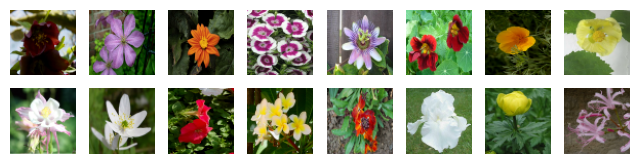

(16, 64, 64, 3)


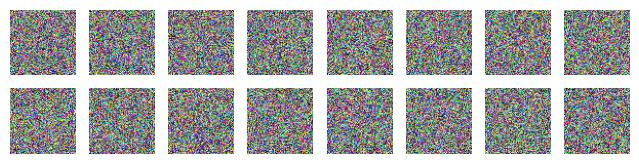

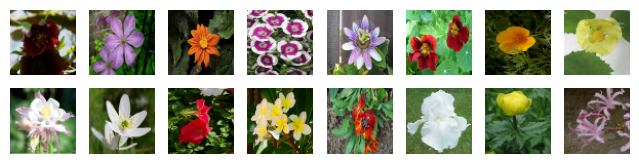

[]


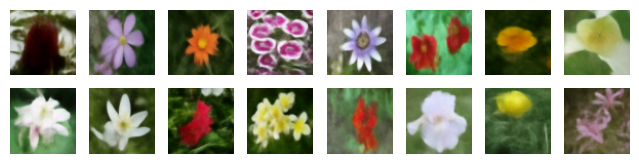

  0%|          | 0/999 [00:00<?, ?it/s]

[]


100%|██████████| 999/999 [00:17<00:00, 58.48it/s]


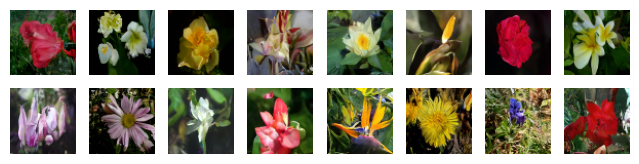

In [26]:
images = next(iter(data))
plotImages(images)
print(images.shape)
rng = jax.random.PRNGKey(4)
noise = jax.random.normal(rng, shape=images.shape, dtype=jnp.float32)
noise_level = 700
noise_levels = jnp.ones((images.shape[0],), dtype=jnp.int32) * noise_level
sampler = DDPMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
noise_schedule = trainer.noise_schedule
noisy_images = noise_schedule.add_noise(images, noise, noise_levels)
plotImages(noisy_images)
regenerated_images = noise_schedule.remove_all_noise(noisy_images, noise, noise_levels)
plotImages(regenerated_images)
pred = unet.apply(trainer.state.params, noisy_images, trainer.noise_schedule.transform_steps(noise_levels))
reconstructed_images, pred_noise =trainer.model_output_transform(noisy_images, pred, noise_levels, noise_schedule)
reconstructed_images = noise_schedule.clip_images(reconstructed_images)
plotImages(reconstructed_images)
samples = sampler.generate_images(num_images=BATCH_SIZE, start_step=999, priors=noisy_images)
plotImages(samples)

In [128]:
(jnp.arange(0, 1000, 10).round())

Array([  0,  10,  20,  30,  40,  50,  60,  70,  80,  90, 100, 110, 120,
       130, 140, 150, 160, 170, 180, 190, 200, 210, 220, 230, 240, 250,
       260, 270, 280, 290, 300, 310, 320, 330, 340, 350, 360, 370, 380,
       390, 400, 410, 420, 430, 440, 450, 460, 470, 480, 490, 500, 510,
       520, 530, 540, 550, 560, 570, 580, 590, 600, 610, 620, 630, 640,
       650, 660, 670, 680, 690, 700, 710, 720, 730, 740, 750, 760, 770,
       780, 790, 800, 810, 820, 830, 840, 850, 860, 870, 880, 890, 900,
       910, 920, 930, 940, 950, 960, 970, 980, 990], dtype=int32)

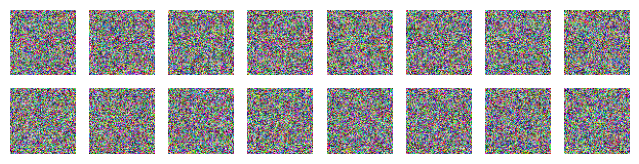

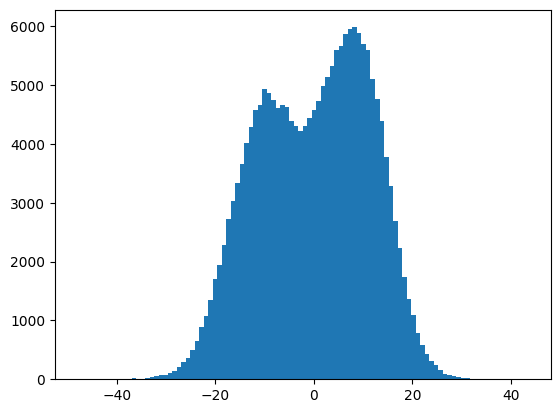

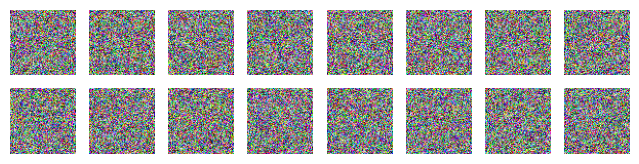

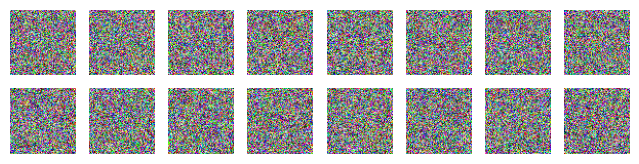

In [190]:
noise_level = 998
noise_levels = jnp.ones((images.shape[0],), dtype=jnp.int32) * noise_level
pred_noise = unet.apply(trainer.state.params, noise, sampler.transform_steps(noise_levels))
reconstructed_images = noise_schedule.remove_all_noise(noise, pred_noise, noise_levels)
plotImages(reconstructed_images)
plt.hist(reconstructed_images.flatten(), bins=100)
plotImages(pred_noise)
noise_level = 200
noise_levels = jnp.ones((images.shape[0],), dtype=jnp.int32) * noise_level
pred_noise = unet.apply(trainer.state.params, reconstructed_images, sampler.transform_steps(noise_levels))
reconstructed_images = noise_schedule.remove_all_noise(reconstructed_images, pred_noise, noise_levels)
plotImages(reconstructed_images)

  0%|          | 0/100 [00:00<?, ?it/s]

100%|██████████| 100/100 [00:05<00:00, 17.08it/s]


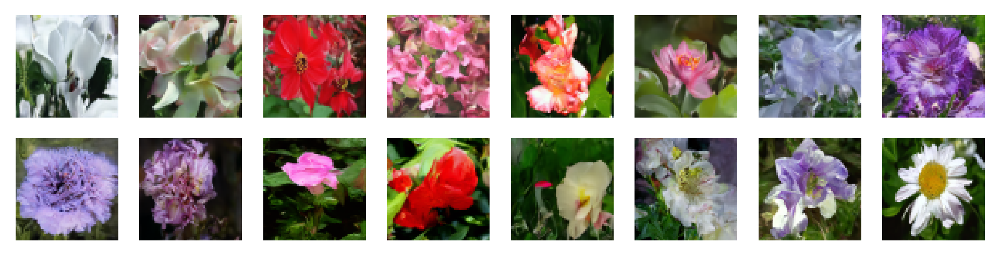

In [26]:
sampler = DDIMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, diffusion_steps=100, priors=None)
plotImages(samples, dpi=300)

  0%|          | 0/100 [00:00<?, ?it/s]

[]


100%|██████████| 100/100 [00:05<00:00, 17.32it/s]


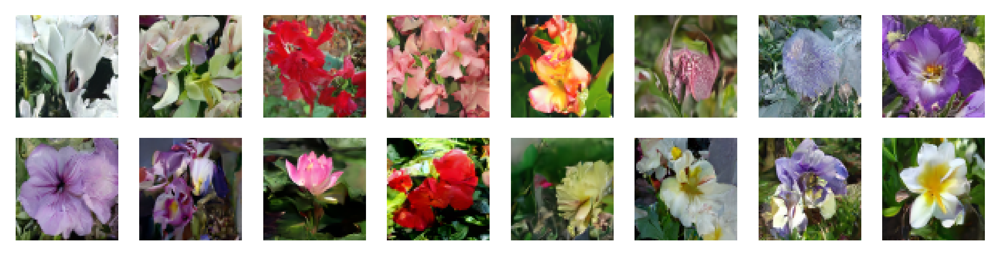

In [27]:
sampler = DDIMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, diffusion_steps=100, priors=None)
plotImages(samples, dpi=300)

  0%|          | 0/1000 [00:00<?, ?it/s]

[]


100%|██████████| 1000/1000 [00:15<00:00, 65.72it/s]


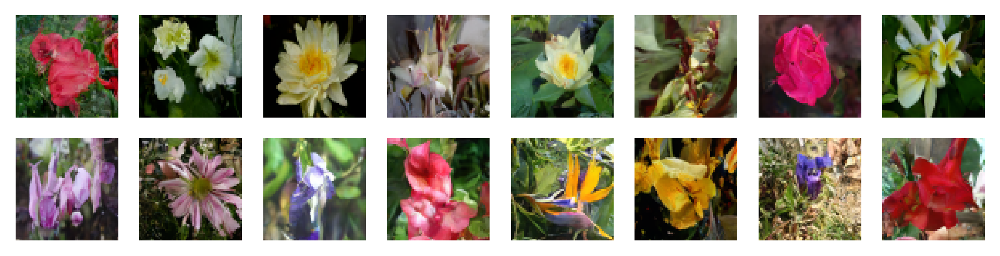

In [28]:
sampler = DDPMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, start_step=1000, priors=None)
plotImages(samples, dpi=300)

100%|██████████| 1000/1000 [00:14<00:00, 68.11it/s]


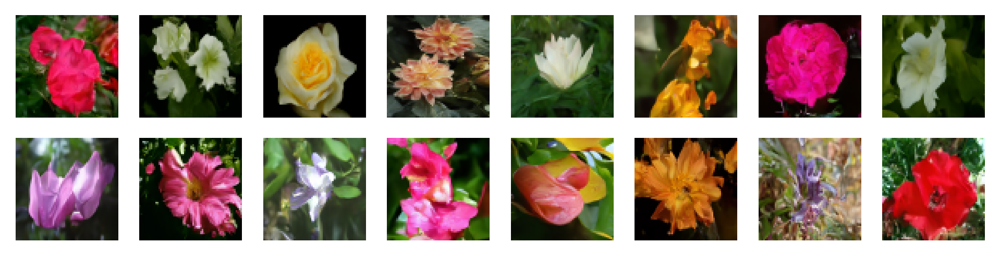

In [28]:
sampler = DDPMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, start_step=1000, priors=None)
plotImages(samples, dpi=300)

100%|██████████| 999/999 [00:14<00:00, 69.16it/s] 


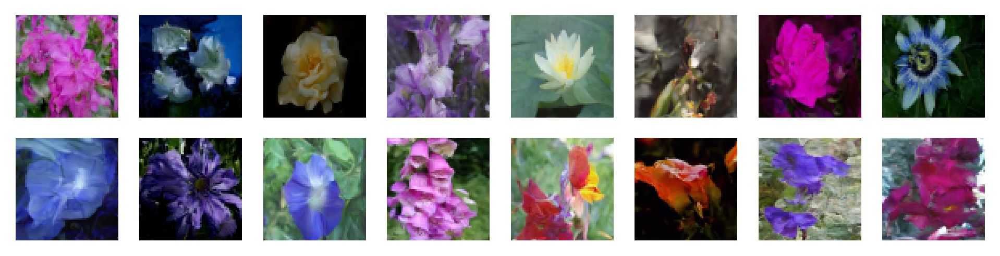

In [254]:
sampler = DDPMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, start_step=999, priors=None)
plotImages(samples, dpi=300)

1000it [00:23, 42.53it/s]


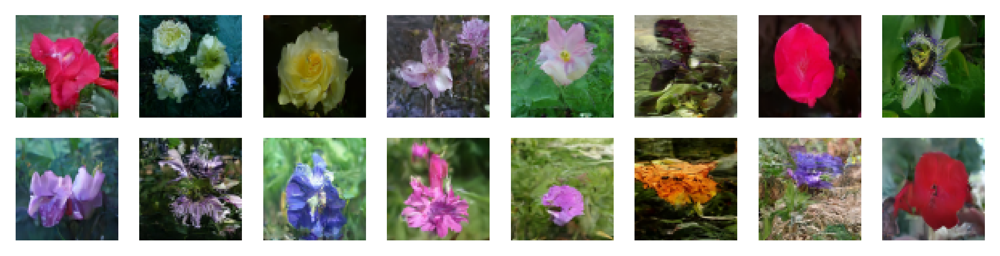

In [33]:
sampler = DDPMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, start_step=999, priors=None)
plotImages(samples, dpi=300)

  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 50/50 [00:05<00:00,  9.60it/s]


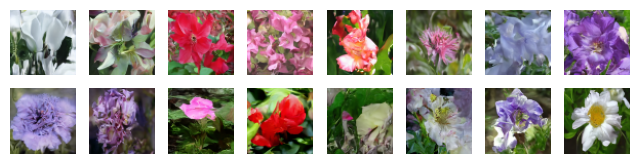

In [37]:
sampler = DDIMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, diffusion_steps=50, start_step=1000, end_step=0, priors=None)
plotImages(samples)

  0%|          | 0/1000 [00:00<?, ?it/s]

[]


100%|██████████| 1000/1000 [00:56<00:00, 17.73it/s]


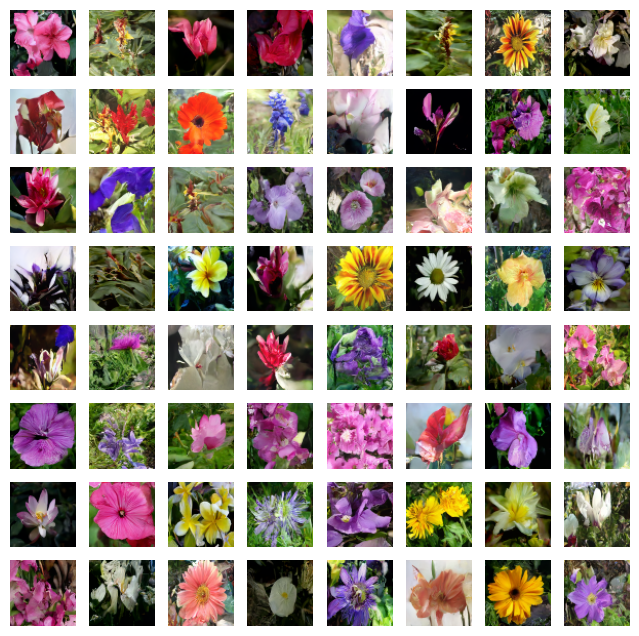

In [29]:
sampler = DDPMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=64, start_step=1000, priors=None)
plotImages(samples)

  0%|          | 0/1000 [00:00<?, ?it/s]

100%|██████████| 1000/1000 [00:47<00:00, 21.05it/s]


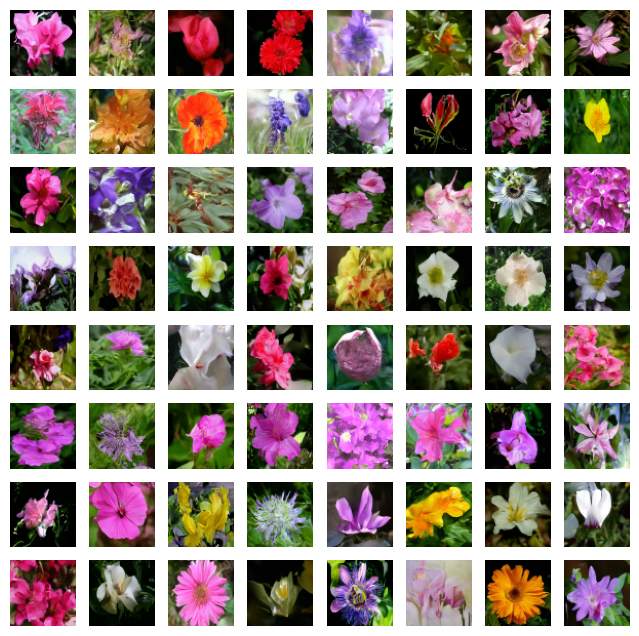

In [38]:
sampler = DDPMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=64, start_step=1000, priors=None)
plotImages(samples)

100%|██████████| 84/84 [00:08<00:00, 10.06it/s]


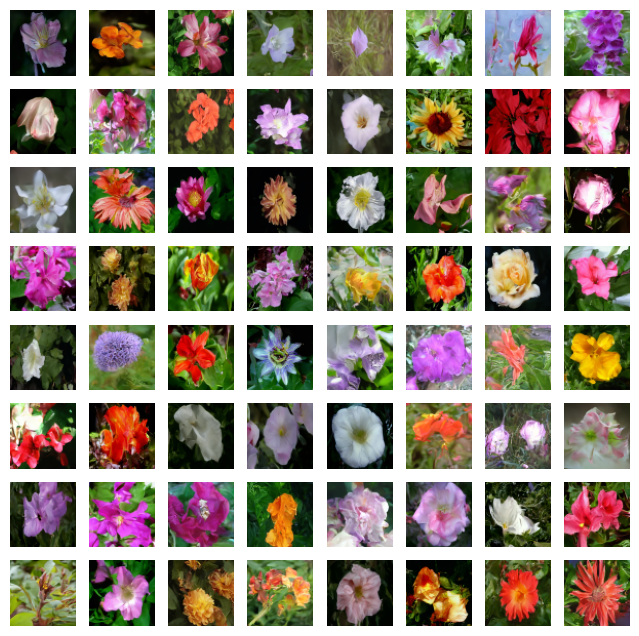

In [40]:
sampler = DDIMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=64, diffusion_steps=80, priors=None)
plotImages(samples)

1000it [01:41,  9.85it/s]


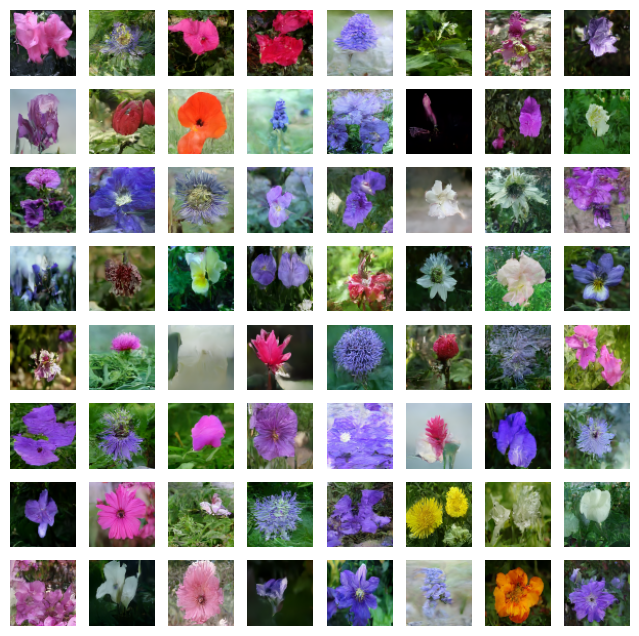

In [27]:
sampler = DDPMSampler()
samples = sampler.generate_images(trainer.model, trainer.best_state.params, trainer.noise_schedule, num_images=64, diffusion_steps=1000, priors=None)
plotImages(samples)

100it [00:11,  8.64it/s]


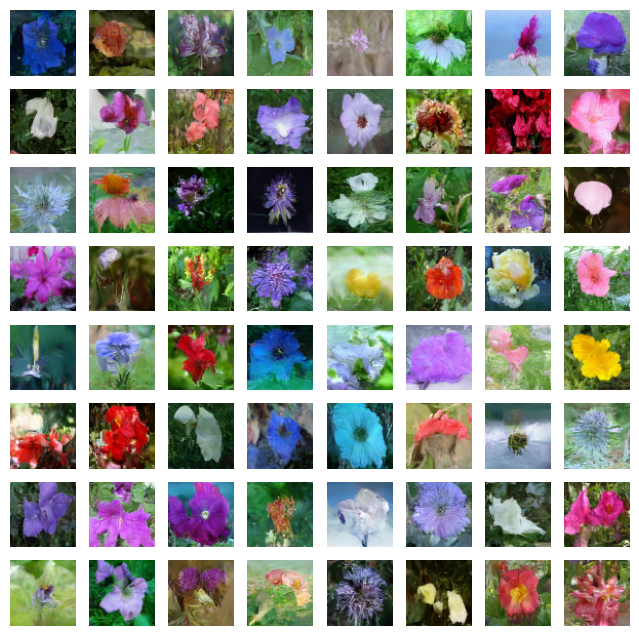

In [32]:
sampler = DDIMSampler()
samples = sampler.generate_images(trainer.model, trainer.best_state.params, trainer.noise_schedule, num_images=64, diffusion_steps=100, priors=None)
plotImages(samples)

1000it [01:17, 12.87it/s]


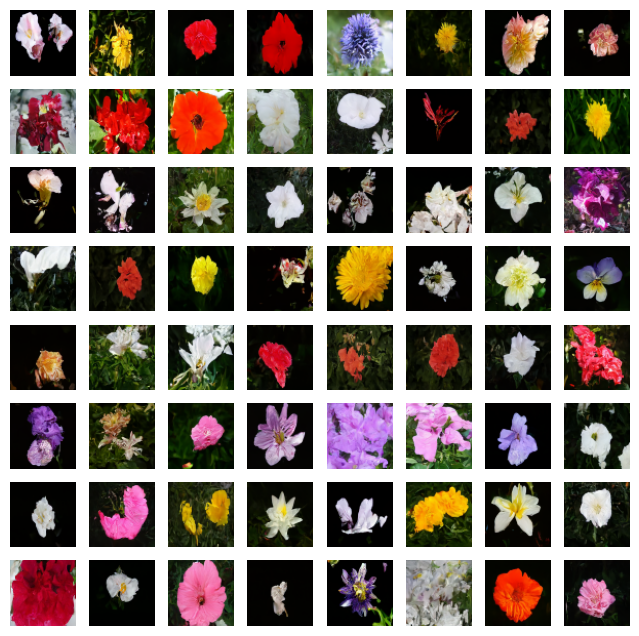

In [36]:
sampler = DDPMSampler()
samples = sampler.generate_images(trainer.model, trainer.best_state.params, trainer.noise_schedule, num_images=64, diffusion_steps=1000, priors=None)
plotImages(samples)

100it [00:09, 10.89it/s]


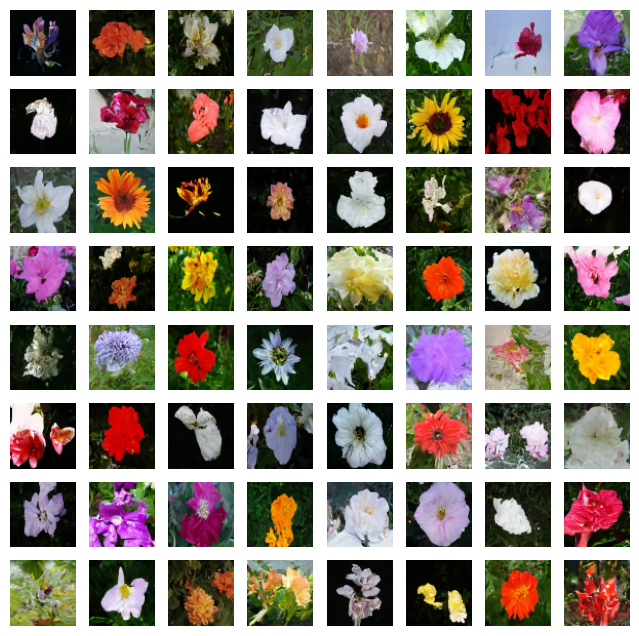

In [35]:
sampler = DDIMSampler()
samples = sampler.generate_images(trainer.model, trainer.best_state.params, trainer.noise_schedule, num_images=64, diffusion_steps=100, priors=None)
plotImages(samples)

1000it [01:18, 12.72it/s]


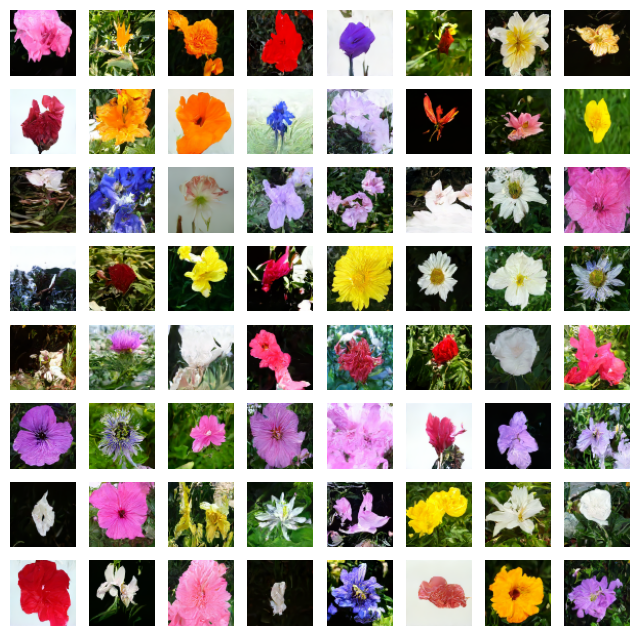

In [34]:
sampler = DDPMSampler()
samples = sampler.generate_images(trainer.model, trainer.state.params, noise_schedule, num_images=64, diffusion_steps=1000, priors=None)
plotImages(samples)

100it [00:14,  7.10it/s]


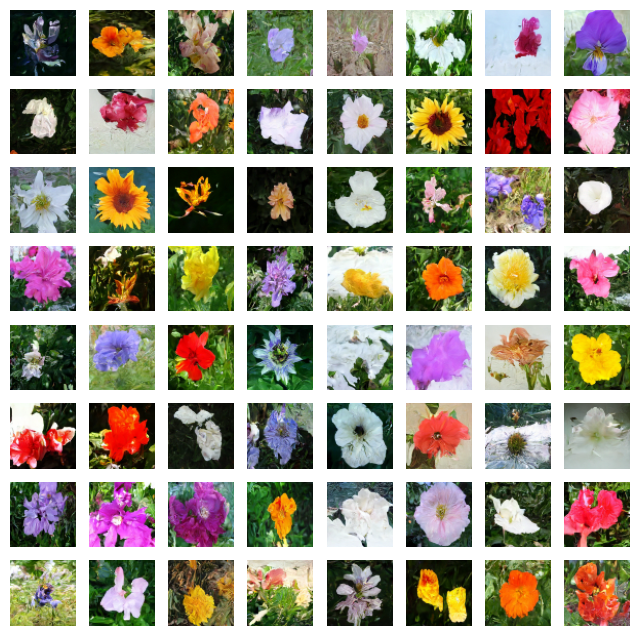

In [33]:
sampler = DDIMSampler()
samples = sampler.generate_images(trainer.model, trainer.state.params, noise_schedule, num_images=64, diffusion_steps=100, priors=None)
plotImages(samples)

1000it [00:12, 82.85it/s]


Samples (64, 64, 64, 3) -0.99983406 0.99983406 -0.3262726


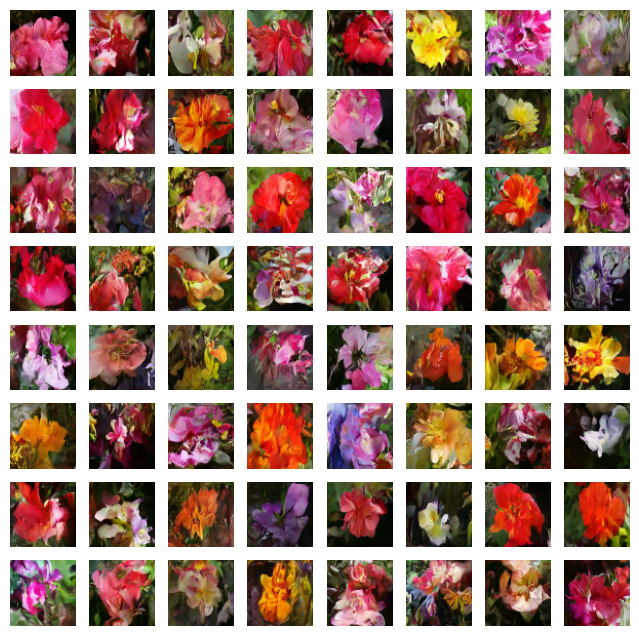

In [26]:
samples = generate_images(trainer.state, trainer.schedule, num_images=64, diffusion_steps=1000)
plotImages(samples)